# Insurance Claims- Fraud Detection

## Problem Statement:
#### Business case:
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.

In [1]:
# Import Necessary Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Loading the Dataset

dfi=pd.read_csv('Automobile_insurance_fraud.csv')
dfi

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


# Exploratory Data Analysis

In [3]:
# Checking the top rows

dfi.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [4]:
# Checking the bottom rows

dfi.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [5]:
# Checking the random samples

dfi.sample(3)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
344,216,38,421940,03-06-2014,IN,100/300,1000,1384.64,5000000,600754,...,NO,66600,16650,11100,38850,Jeep,Grand Cherokee,2012,Y,NaN
601,98,31,171183,01-02-1990,IN,100/300,500,671.92,0,468300,...,?,64080,7120,7120,49840,Ford,Escape,1997,N,NaN
118,164,38,319232,31-10-1997,IL,250/500,2000,1269.76,0,467743,...,YES,90000,18000,9000,63000,Ford,Fusion,2015,N,NaN


In [7]:
# Checking the columns name

dfi.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [8]:
# Checking the information of data

dfi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [10]:
# Checking the shape of data

dfi.shape

(1000, 40)

There are 1000 rows and 40 columns

In [11]:
# Checking the data types

dfi.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [12]:
# Checking the count of each features

for i in dfi:
    print(dfi[i].value_counts())
    print("^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^")

194    8
254    7
210    7
101    7
140    7
      ..
312    1
62     1
309    1
308    1
0      1
Name: months_as_customer, Length: 391, dtype: int64
^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
35    32
44    32
36    32
42    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
55    14
25    14
49    14
50    13
53    13
24    10
54    10
61    10
51     9
60     9
56     8
58     8
23     7
21     6
59     5
52     4
62     4
63     2
64     2
20     1
22     1
19     1
Name: age, dtype: int64
^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
296960    1
206213    1
853360    1
521585    1
290162    1
         ..
276804    1
426708    1
963285    1
789208    1
116735    1
Name: policy_number, Length: 1000, dtype: int64
^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
01-01-2006    3
28-04-1992    3
05-08-1992    3


In [13]:
# Checking the unique value of each features
dfi.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [16]:
# Droping the _c39 columns as it contain more NaN

dfi=dfi.drop('_c39',axis=1)

In [17]:
dfi.shape # Checking the shape after dropping of _c39

(1000, 39)

In [18]:
# Checking the categorical data

categorical_data=[]
for i in dfi.dtypes.index:
    if dfi.dtypes[i]=='object':
        categorical_data.append(i)
print(categorical_data)

['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [19]:
# Checking the Numerical_data

numerical_data=[]
for i in dfi.dtypes.index:
    if dfi.dtypes[i]!='object':
        numerical_data.append(i)
print(numerical_data)

['months_as_customer', 'age', 'policy_number', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']


In [20]:
# Checking the statistical summary of data

dfi.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


In [21]:
# In data most of place having '?' replace with No info

dfi=dfi.replace('?','No Info')
dfi

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,No Info,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,No Info,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,No Info,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [23]:
# Checking the count for umbrella_limit

dfi['umbrella_limit'].value_counts()

 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64

In [27]:
# There is one negative value -1000000 in Umbrella Limit. Let's drop them

dfi.drop(dfi[dfi['umbrella_limit']==-1000000].index,inplace=True)

In [28]:
dfi['umbrella_limit'].value_counts()

0           798
6000000      57
5000000      46
4000000      39
7000000      29
3000000      12
8000000       8
9000000       5
2000000       3
10000000      2
Name: umbrella_limit, dtype: int64

We have successfully droped one row in Umbrella Limit

In [35]:
# Converting incident date into datetime data type

import datetime as dt

dfi['Incident_Day']=pd.to_datetime(dfi.incident_date).dt.day

dfi['Incident_Month']=pd.to_datetime(dfi.incident_date).dt.month

dfi['Incident_Year']=pd.to_datetime(dfi.incident_date).dt.year

In [36]:
dfi.head(3)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Incident_Date,Incident_Month,Incident_Year,Incident_Day
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,13020,52080,Saab,92x,2004,Y,25,1,2015,25
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,780,3510,Mercedes,E400,2007,Y,21,1,2015,21
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3850,23100,Dodge,RAM,2007,N,22,2,2015,22


In [37]:
# Let's drop the Incident Date Column from data set
dfi=dfi.drop(columns=['incident_date','Incident_Date'],axis=1)
dfi.head(2)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Incident_Month,Incident_Year,Incident_Day
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,6510,13020,52080,Saab,92x,2004,Y,1,2015,25
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,780,780,3510,Mercedes,E400,2007,Y,1,2015,21


In [38]:
# Converting policy_bind_date to datetime data type

dfi['Policy_blind_day']=pd.to_datetime(dfi.policy_bind_date).dt.day

dfi['Policy_blind_month']=pd.to_datetime(dfi.policy_bind_date).dt.month

dfi['Policy_blind_year']=pd.to_datetime(dfi.policy_bind_date).dt.year

In [39]:
# Let's drop the policy_bind_date from data set
dfi=dfi.drop('policy_bind_date',axis=1)
dfi.head(3)

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,auto_make,auto_model,auto_year,fraud_reported,Incident_Month,Incident_Year,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
0,328,48,521585,OH,250/500,1000,1406.91,0,466132,MALE,...,Saab,92x,2004,Y,1,2015,25,17,10,2014
1,228,42,342868,IN,250/500,2000,1197.22,5000000,468176,MALE,...,Mercedes,E400,2007,Y,1,2015,21,27,6,2006
2,134,29,687698,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,Dodge,RAM,2007,N,2,2015,22,9,6,2000


In [40]:
dfi.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage          

In [41]:
# Dropping the unncessary columns

dfi=dfi.drop(columns=['policy_number','insured_zip','incident_location'],axis=1)

In [42]:
dfi.shape

(999, 40)

In [43]:
dfi.sample(3)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,auto_make,auto_model,auto_year,fraud_reported,Incident_Month,Incident_Year,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
329,78,31,IN,250/500,1000,1554.64,4000000,MALE,PhD,protective-serv,...,Honda,CRV,2009,Y,3,2015,2,25,1,1999
136,200,40,IL,100/300,1000,1439.34,0,FEMALE,High School,sales,...,Ford,Escape,2015,N,1,2015,1,5,11,2010
49,192,35,IL,100/300,1000,1245.89,0,FEMALE,Masters,exec-managerial,...,Mercedes,C300,2000,N,1,2015,1,3,10,1997


In [44]:
# Checking the count of fraud reported

dfi['fraud_reported'].value_counts()

N    752
Y    247
Name: fraud_reported, dtype: int64

N    752
Y    247
Name: fraud_reported, dtype: int64


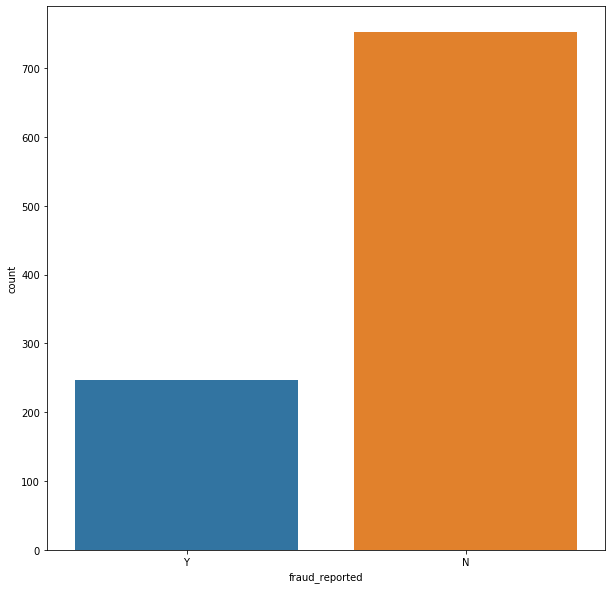

In [47]:
print(dfi['fraud_reported'].value_counts())
plt.figure(figsize=(10,10))
sns.countplot(dfi['fraud_reported'])
plt.show()

In Fraud Reported there 247 claims that it is a insurance fraud, 752 shows it is not a fraud. There is a imbalance in data.

In [48]:
# Checking the Null value

dfi.isnull()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,auto_make,auto_model,auto_year,fraud_reported,Incident_Month,Incident_Year,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
996,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
997,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
998,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [49]:
dfi.isnull().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_claim                  0
auto_make 

There is no null value present in data

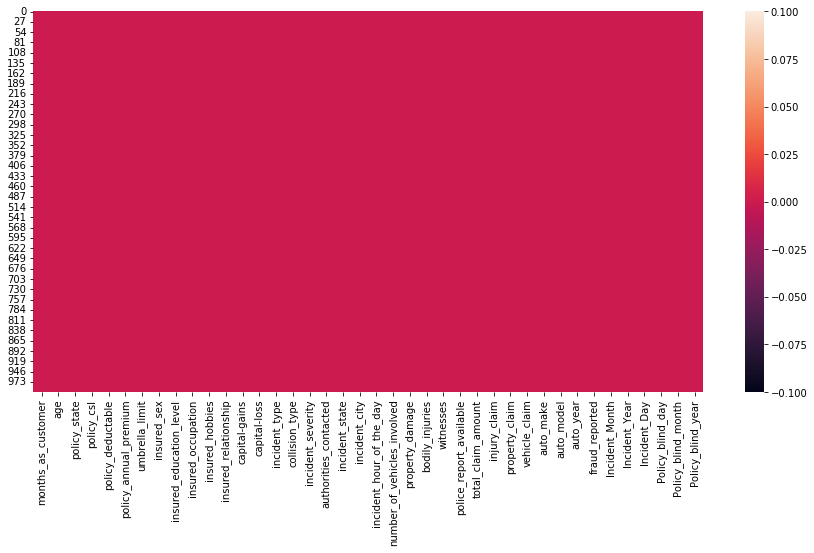

In [53]:
plt.figure(figsize=(15,7))
sns.heatmap(dfi.isnull())
plt.show()

In [54]:
# Checking the Correlation

dfi_corr=dfi.corr()
dfi_corr

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,...,injury_claim,property_claim,vehicle_claim,auto_year,Incident_Month,Incident_Year,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
months_as_customer,1.000000,0.922141,0.027553,0.004785,0.016146,0.007032,0.019559,0.070522,0.015319,-0.009328,...,0.065185,0.033613,0.059979,0.000763,0.025184,NaN,-0.012171,0.052600,0.006279,-0.047682
age,0.922141,1.000000,0.029553,0.014293,0.018441,-0.006777,0.007052,0.087103,0.022386,-0.015286,...,0.075451,0.060350,0.062131,0.001862,0.023658,NaN,-0.006649,0.054305,0.015759,-0.037161
policy_deductable,0.027553,0.029553,1.000000,-0.002897,0.009927,0.034305,-0.022574,0.061173,0.050401,-0.024055,...,0.039370,0.067063,0.006967,0.024570,-0.007189,NaN,-0.016601,0.007944,-0.051244,-0.050580
policy_annual_premium,0.004785,0.014293,-0.002897,1.000000,-0.005941,-0.013441,0.023237,-0.001644,-0.045732,0.027209,...,-0.017712,-0.012359,0.019728,-0.048775,0.021814,NaN,0.014339,-0.024804,-0.035112,0.001552
umbrella_limit,0.016146,0.018441,0.009927,-0.005941,1.000000,-0.048134,-0.023202,-0.023088,-0.022041,0.021659,...,-0.045220,-0.021998,-0.037166,0.008520,0.041765,NaN,-0.020351,-0.046340,0.009276,0.047225
capital-gains,0.007032,-0.006777,0.034305,-0.013441,-0.048134,1.000000,-0.046083,-0.016236,0.060944,0.054799,...,0.026154,0.001043,0.017327,0.030078,0.028765,NaN,0.016821,0.006935,-0.011792,0.040471
capital-loss,0.019559,0.007052,-0.022574,0.023237,-0.023202,-0.046083,1.000000,-0.025252,-0.014120,-0.023290,...,-0.046303,-0.024850,-0.034271,-0.055258,0.023935,NaN,-0.016518,-0.037213,0.004160,-0.025585
incident_hour_of_the_day,0.070522,0.087103,0.061173,-0.001644,-0.023088,-0.016236,-0.025252,1.000000,0.120999,-0.034353,...,0.165730,0.179511,0.215596,0.021689,0.044983,NaN,-0.028297,-0.009286,-0.000787,0.035602
number_of_vehicles_involved,0.015319,0.022386,0.050401,-0.045732,-0.022041,0.060944,-0.014120,0.120999,1.000000,0.013046,...,0.224923,0.221272,0.271176,0.033355,0.031957,NaN,-0.017441,0.004818,-0.045259,0.025874
bodily_injuries,-0.009328,-0.015286,-0.024055,0.027209,0.021659,0.054799,-0.023290,-0.034353,0.013046,1.000000,...,0.047635,0.042308,0.045502,-0.022403,0.046191,NaN,-0.030272,-0.044995,-0.032085,0.028932


In [59]:
# There is more Nan Present in Incident_Year lets drop the Incident_Year column

dfi=dfi.drop('Incident_Year',axis=1)

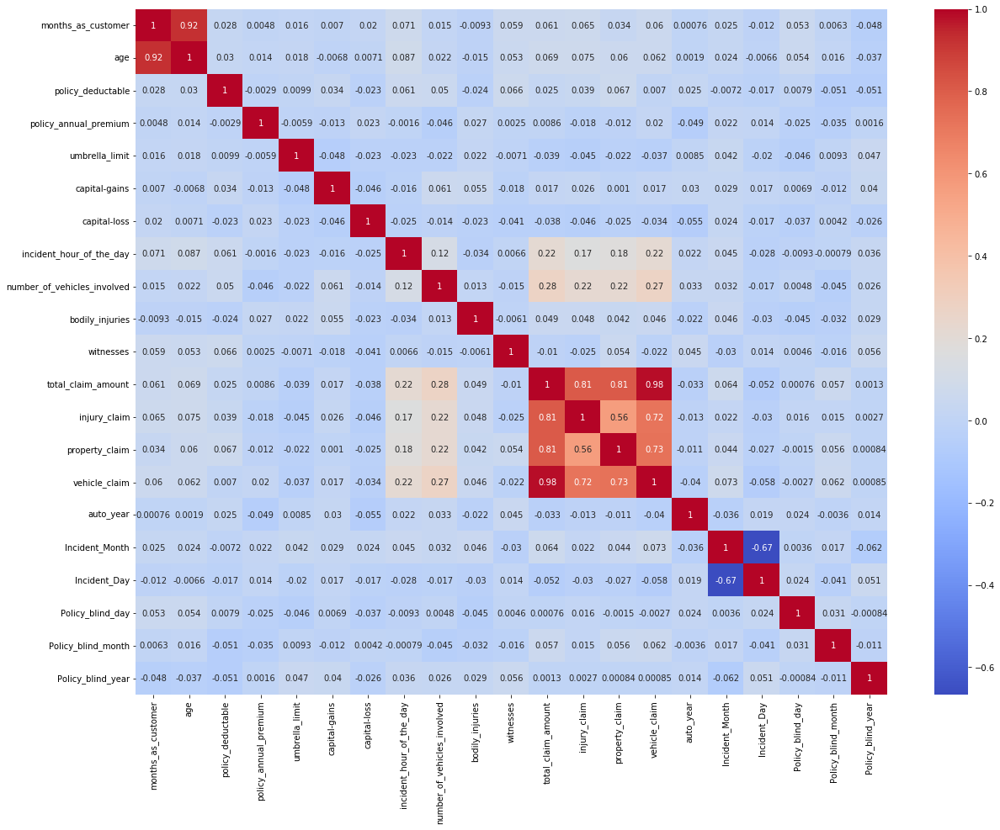

In [62]:
plt.figure(figsize=(20,15))
sns.heatmap(dfi.corr(),annot=True,cmap='coolwarm')
plt.show()

In total_claim_amount, injury_claim, grocery_claim, vehicle_claim there is a high correlation present, other 's columns are less corelated.'

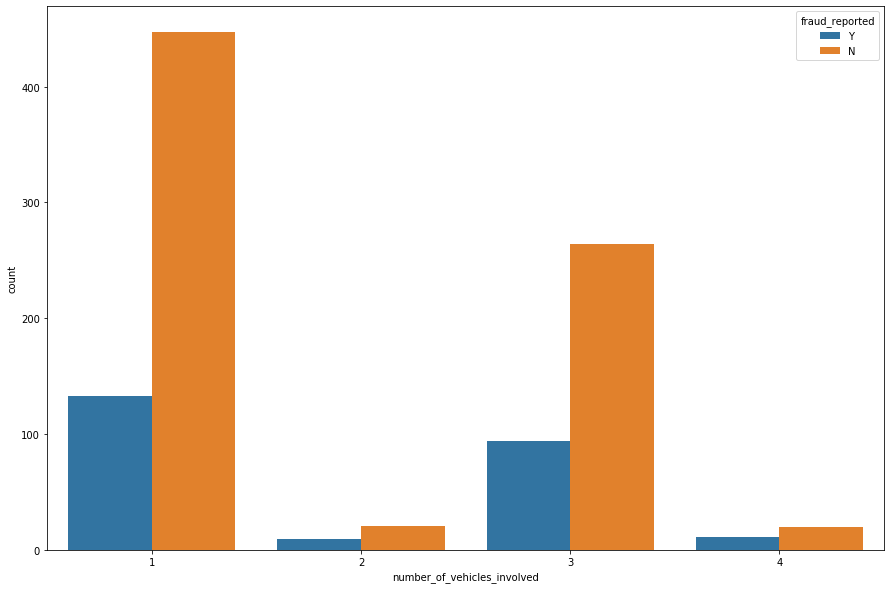

In [74]:
plt.figure(figsize=(15,10))
sns.countplot(x='number_of_vehicles_involved',data=dfi,hue='fraud_reported')
plt.show()

Those who have more than one vehicle there is high chance of fraud report

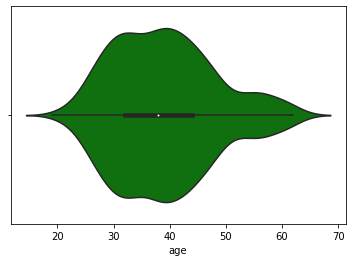

In [78]:
sns.violinplot(x='age',hue='fraud_reported',data=dfi,color='green')
plt.show()

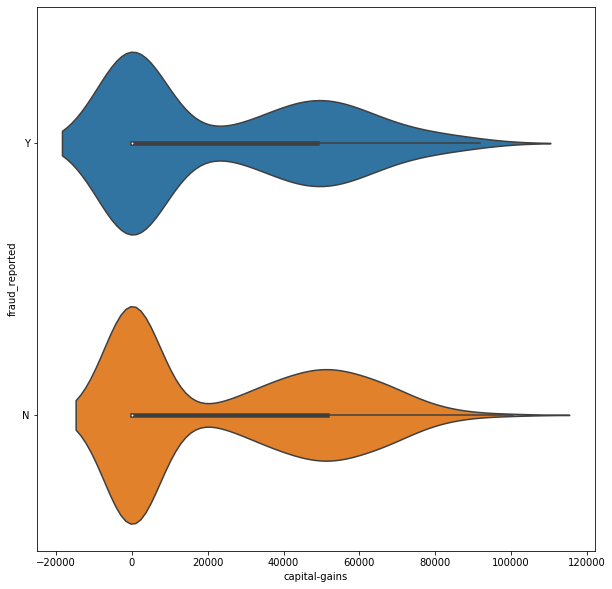

In [81]:
plt.figure(figsize=(10,10))
sns.violinplot(x='capital-gains',y='fraud_reported',data=dfi)
plt.show()

Most of the fraud reported in the range between 40000 and 60000

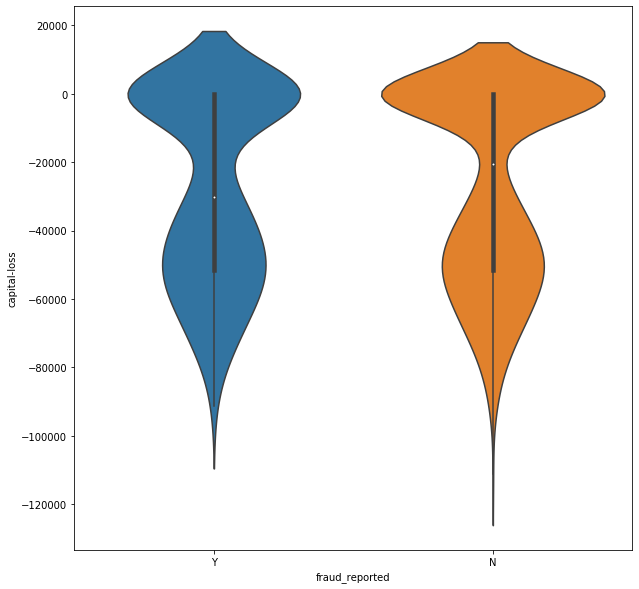

In [84]:
plt.figure(figsize=(10,10))
sns.violinplot(y='capital-loss',x='fraud_reported',data=dfi)
plt.show()

We see in the above violinplot most of the fraud reported in the capital loss range between -40000 and -60000

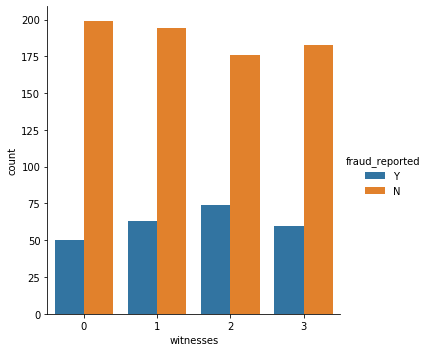

In [91]:

sns.catplot(x='witnesses',hue='fraud_reported',data=dfi,kind='count')
plt.show()

Who have more than 1 witnesses reported the fraud.

1000    351
500     341
2000    307
Name: policy_deductable, dtype: int64


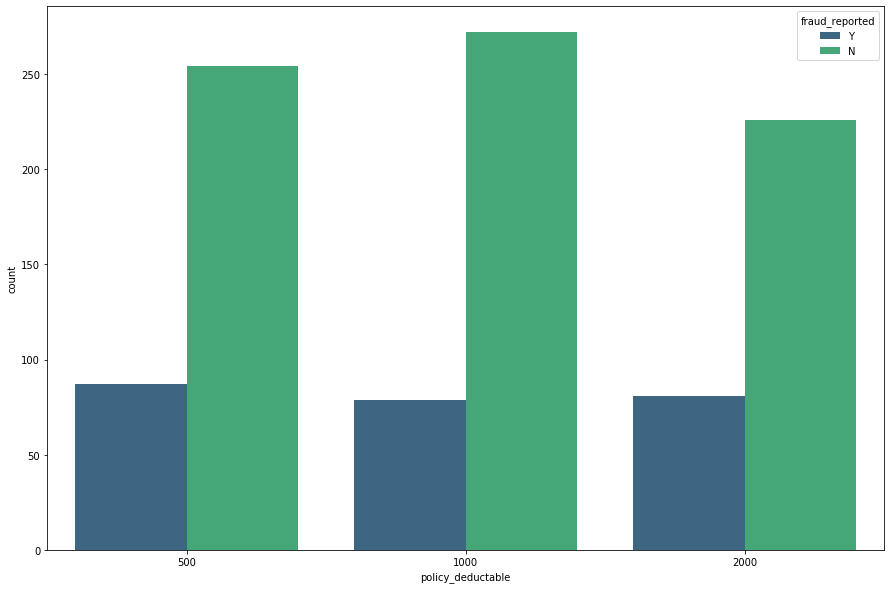

In [96]:
print(dfi['policy_deductable'].value_counts())
plt.figure(figsize=(15,10))
sns.countplot(x='policy_deductable',hue='fraud_reported',data=dfi,palette='viridis')
plt.show()

Slight differenc in Policy deductable. Fraud report not happen in the 1000 policy deductable

1000    351
500     341
2000    307
Name: policy_deductable, dtype: int64


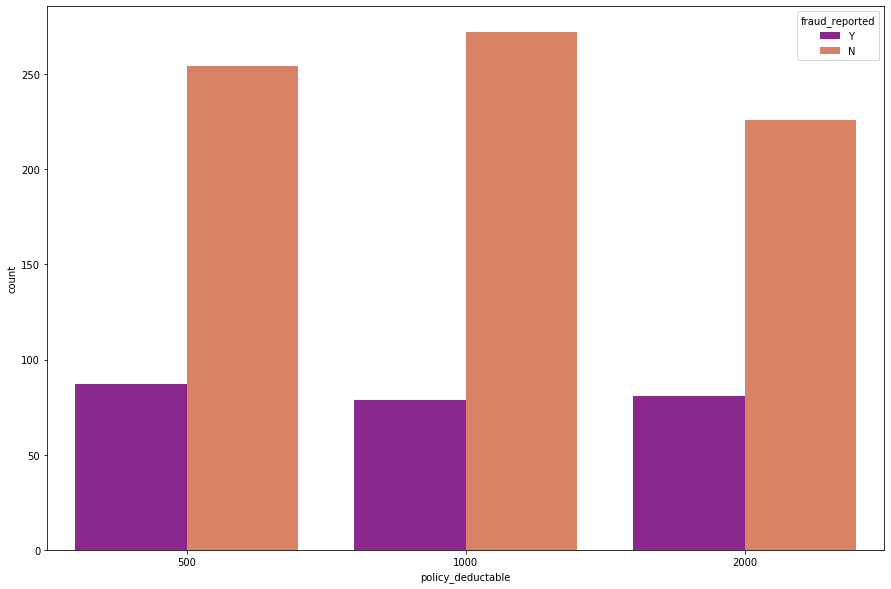

In [102]:
print(dfi['policy_deductable'].value_counts())
plt.figure(figsize=(15,10))
sns.countplot(x='policy_deductable',hue='fraud_reported',data=dfi,palette='plasma')
plt.show()

0           798
6000000      57
5000000      46
4000000      39
7000000      29
3000000      12
8000000       8
9000000       5
2000000       3
10000000      2
Name: umbrella_limit, dtype: int64


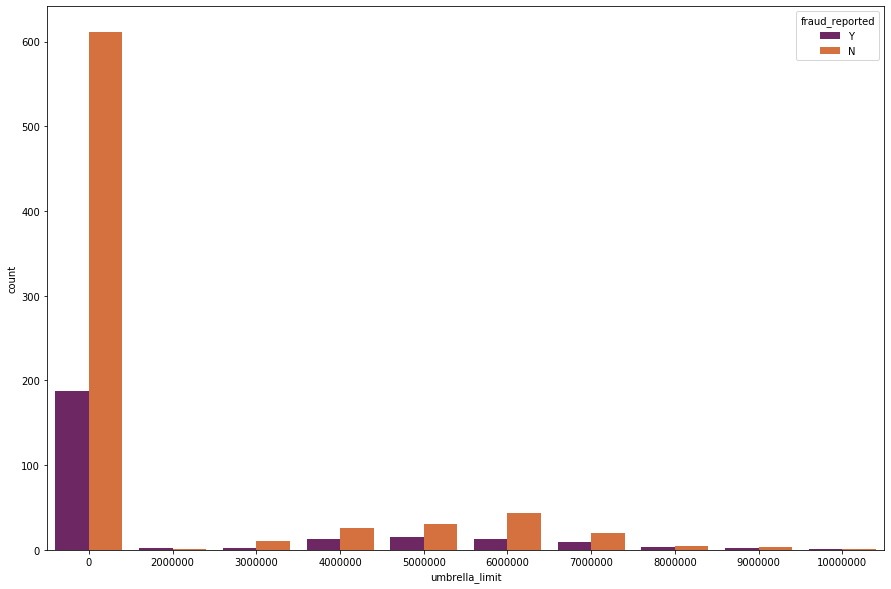

In [101]:
print(dfi['umbrella_limit'].value_counts())
plt.figure(figsize=(15,10))
sns.countplot(x='umbrella_limit',hue='fraud_reported',data=dfi,palette='inferno')
plt.show()

1000    351
500     341
2000    307
Name: policy_deductable, dtype: int64


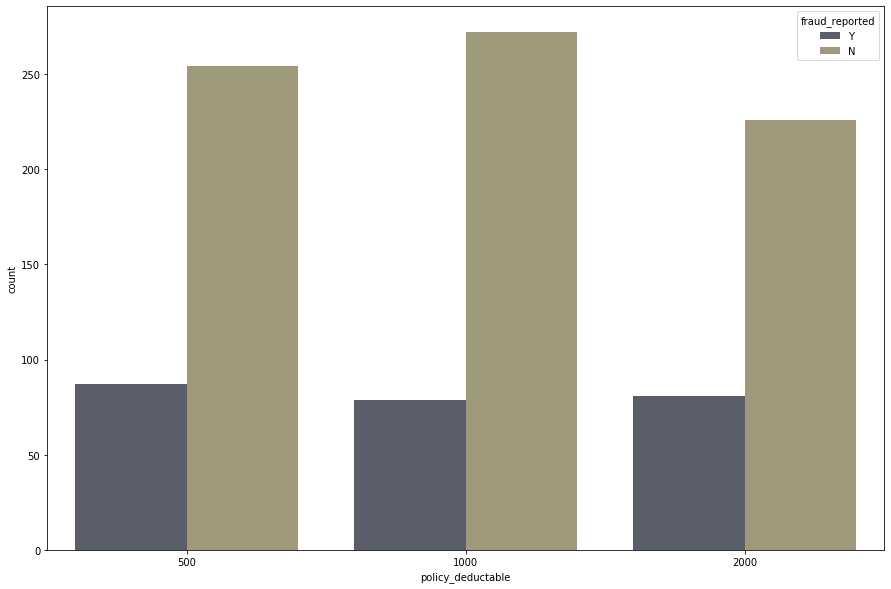

In [100]:
print(dfi['policy_deductable'].value_counts())
plt.figure(figsize=(15,10))
sns.countplot(x='policy_deductable',hue='fraud_reported',data=dfi,palette='cividis')
plt.show()

17    54
3     53
0     52
23    51
16    49
4     46
10    46
13    45
6     44
14    43
9     43
21    42
18    41
7     40
19    40
12    40
15    39
22    38
8     36
20    34
5     33
2     31
11    30
1     29
Name: incident_hour_of_the_day, dtype: int64


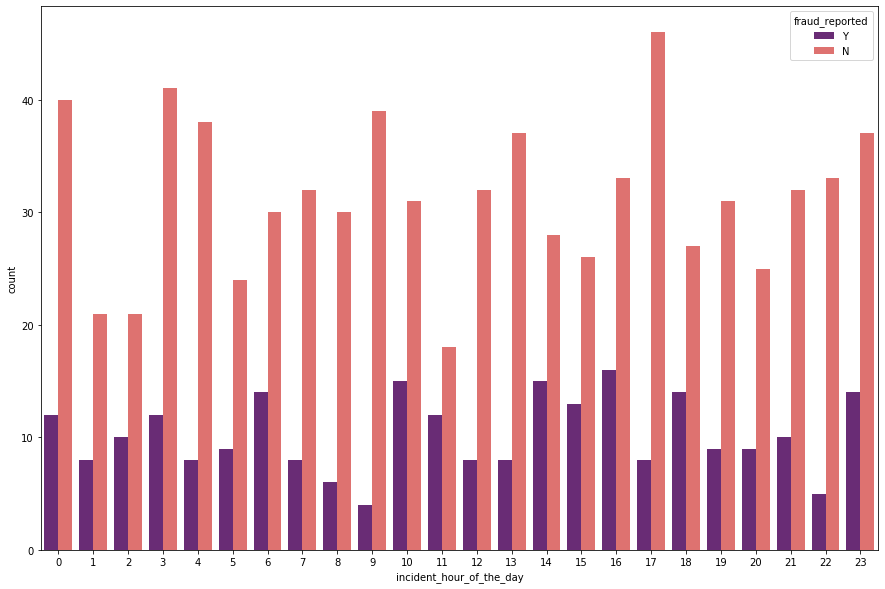

In [106]:
print(dfi['incident_hour_of_the_day'].value_counts())
plt.figure(figsize=(15,10))
sns.countplot(x='incident_hour_of_the_day',hue='fraud_reported',data=dfi,palette='magma')
plt.show()

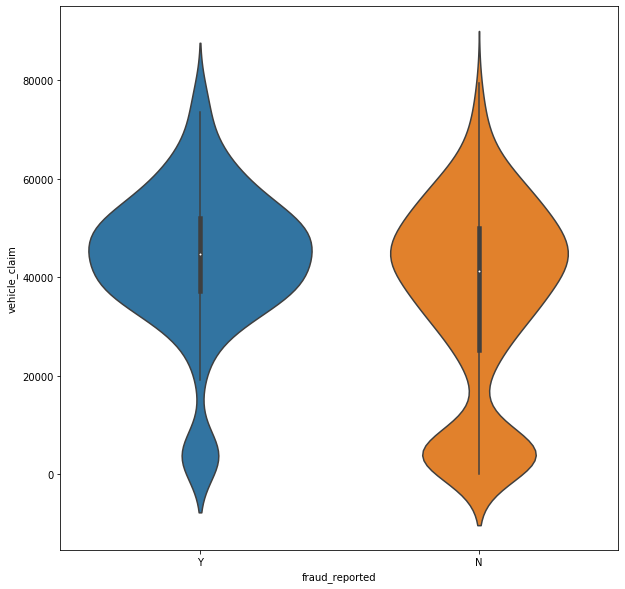

In [111]:
plt.figure(figsize=(10,10))
sns.violinplot(y='vehicle_claim',x='fraud_reported',data=dfi)
plt.show()

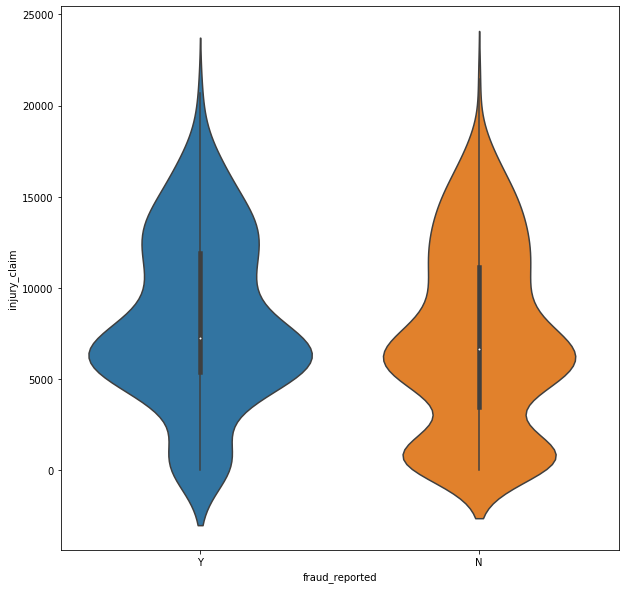

In [115]:
plt.figure(figsize=(10,10))
sns.violinplot(y='injury_claim',x='fraud_reported',data=dfi)
plt.show()

In the above plot it shows that between 5000 and 10000 there is fraud detection in injury claim

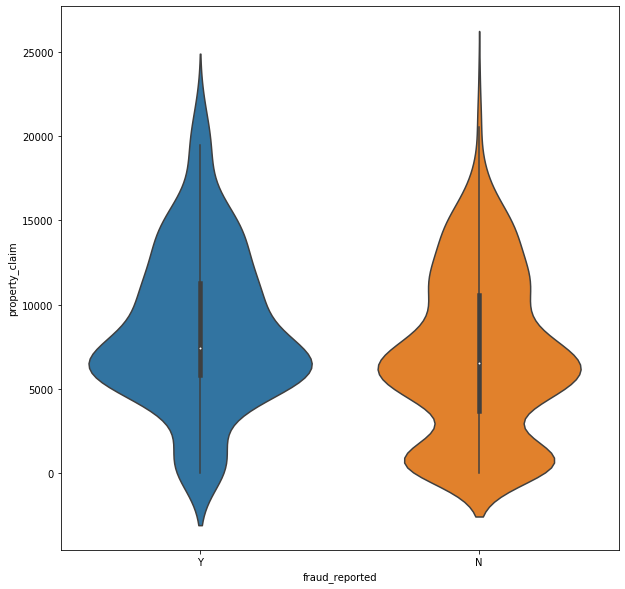

In [116]:
plt.figure(figsize=(10,10))
sns.violinplot(y='property_claim',x='fraud_reported',data=dfi)
plt.show()

JD             161
High School    160
Associate      144
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


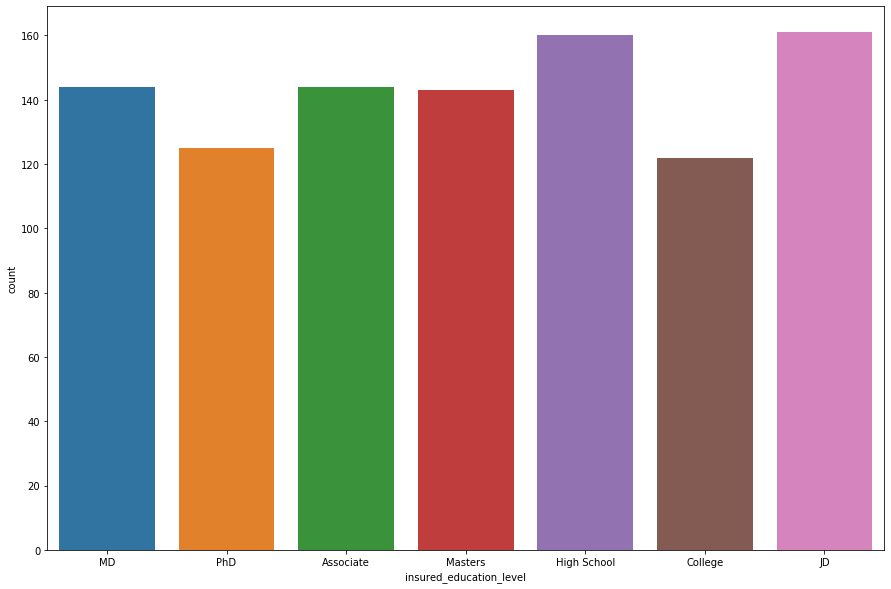

In [119]:
plt.figure(figsize=(15,10))
print(dfi['insured_education_level'].value_counts())
sns.countplot(dfi['insured_education_level'])
plt.show()

More of customer are completed the highschool.

JD             161
High School    160
Associate      144
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


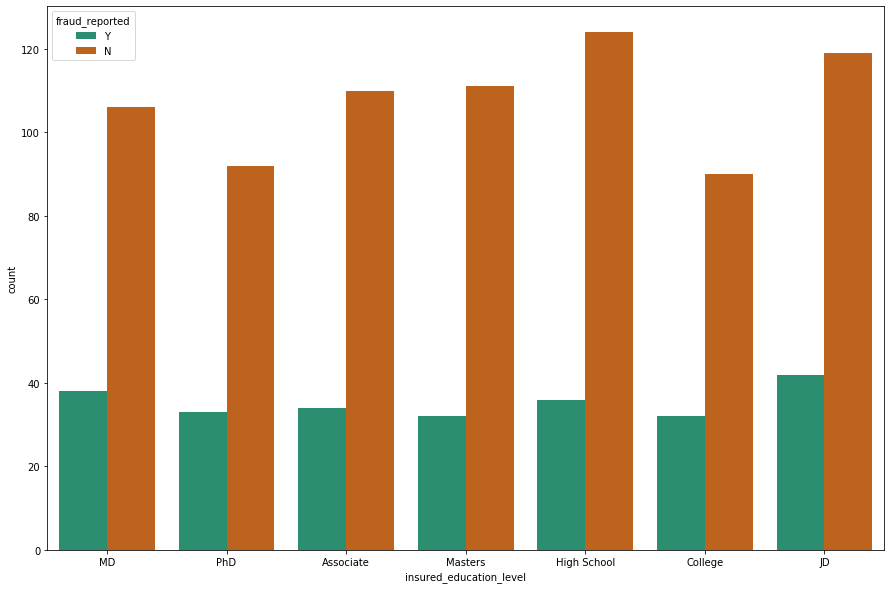

In [122]:
plt.figure(figsize=(15,10))
print(dfi['insured_education_level'].value_counts())
sns.countplot(x='insured_education_level',hue='fraud_reported',data=dfi,palette='Dark2')
plt.show()

machine-op-inspct    92
prof-specialty       85
tech-support         78
exec-managerial      76
sales                76
craft-repair         74
transport-moving     72
priv-house-serv      71
other-service        71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


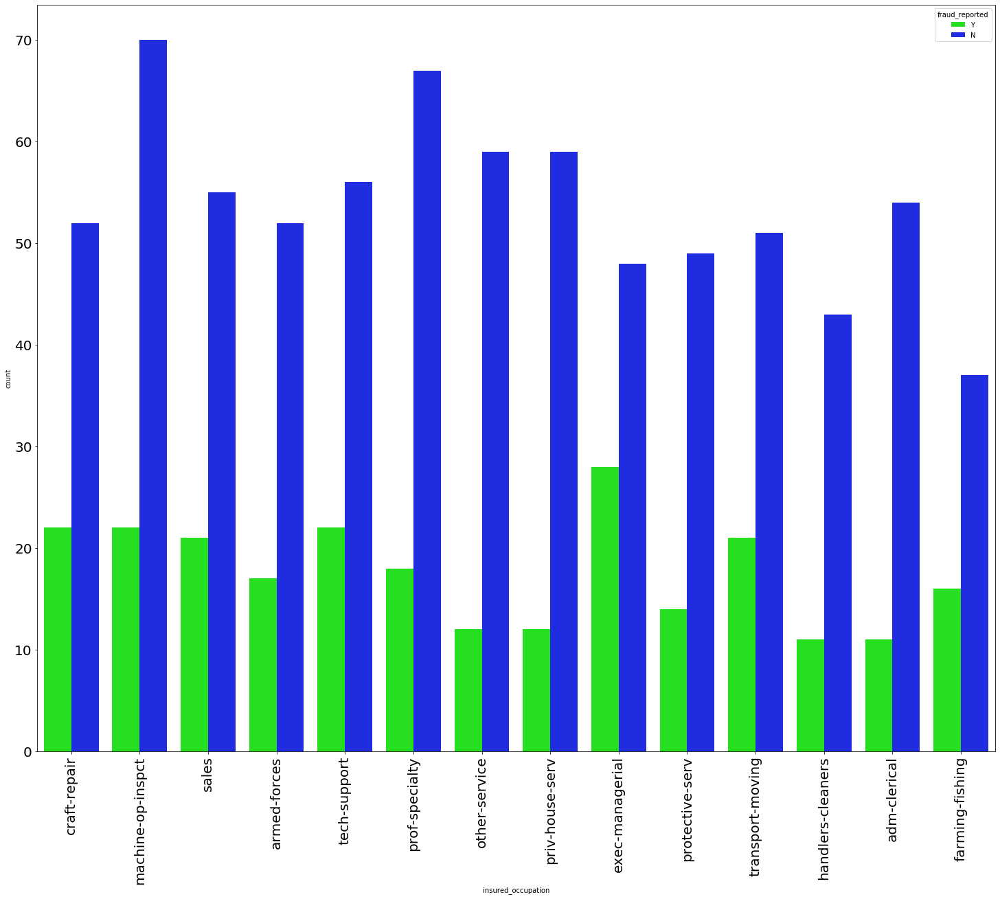

In [127]:
plt.figure(figsize=(25,20))
print(dfi['insured_occupation'].value_counts())
sns.countplot(x='insured_occupation',hue='fraud_reported',data=dfi,palette='hsv')
plt.xticks(rotation=90,fontsize=20)
plt.yticks(fontsize=20)
plt.show()

More number of Customer are in machine-op-inspect 

NY    262
SC    248
WV    217
VA    110
NC    109
PA     30
OH     23
Name: incident_state, dtype: int64


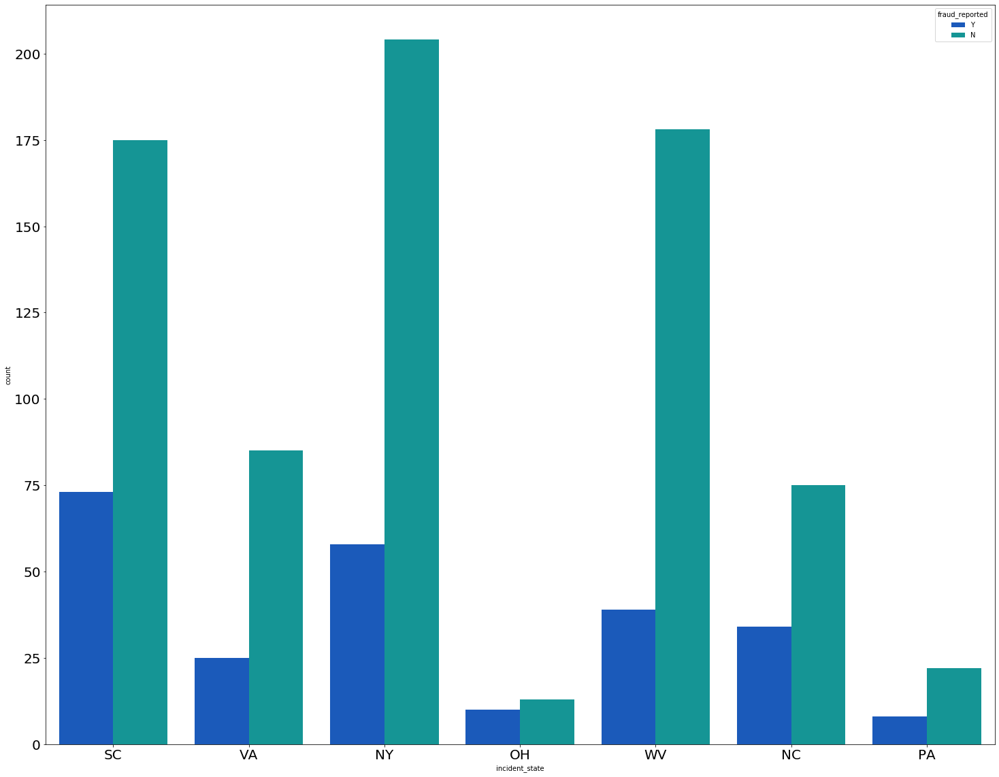

In [142]:
plt.figure(figsize=(25,20))
print(dfi['incident_state'].value_counts())
sns.countplot(x='incident_state',hue='fraud_reported',data=dfi,palette='winter')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

More number of Fraud reported happened in NY(NewYork)

Minor Damage      354
Total Loss        280
Major Damage      275
Trivial Damage     90
Name: incident_severity, dtype: int64


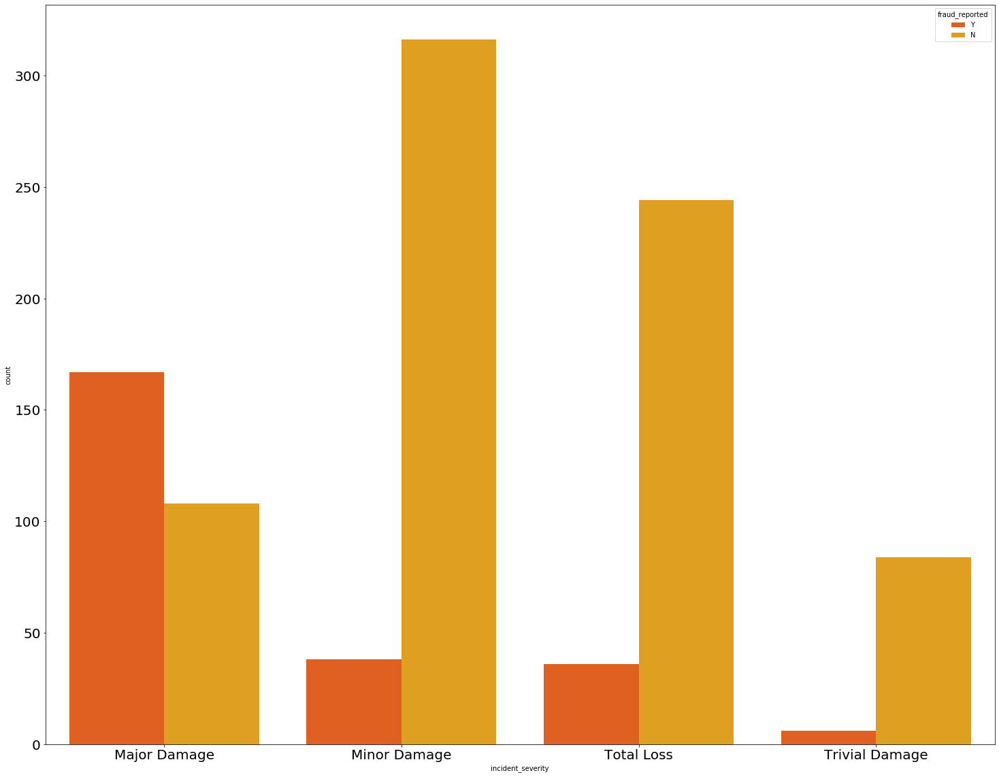

In [141]:
plt.figure(figsize=(25,20))
print(dfi['incident_severity'].value_counts())
sns.countplot(x='incident_severity',hue='fraud_reported',data=dfi,palette='autumn')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

The severity is high in Major Damage category

NO         343
No Info    342
YES        314
Name: police_report_available, dtype: int64


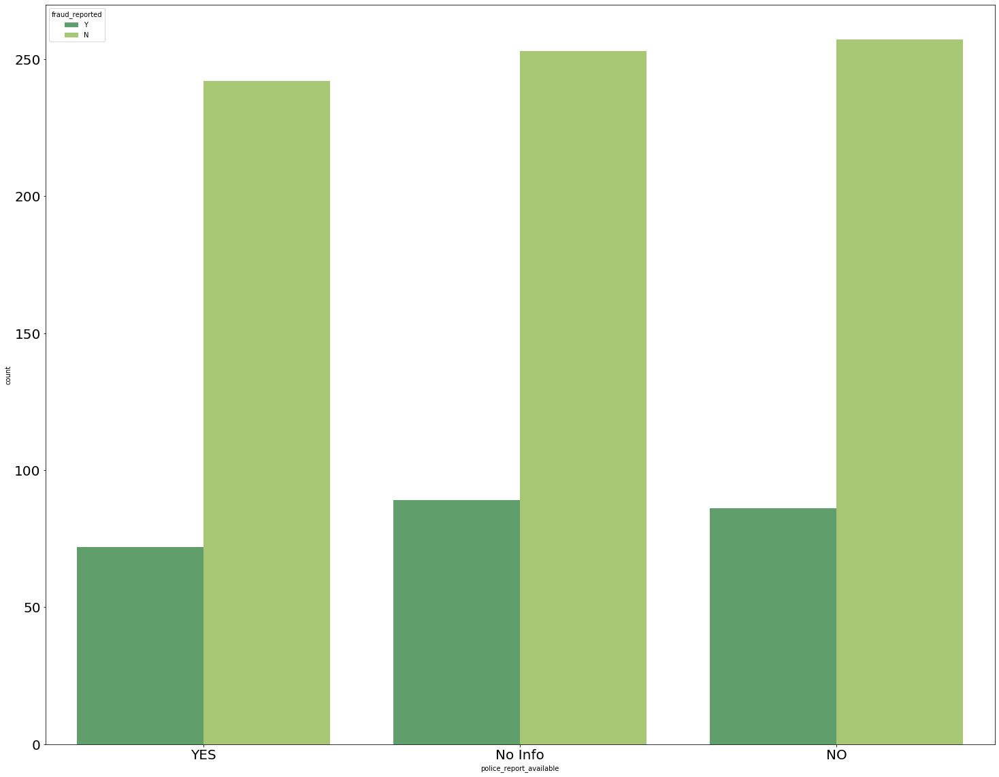

In [140]:
plt.figure(figsize=(25,20))
print(dfi['police_report_available'].value_counts())
sns.countplot(x='police_report_available',hue='fraud_reported',data=dfi,palette='summer')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

There is a high count where police support is not available.

OH    351
IL    338
IN    310
Name: policy_state, dtype: int64


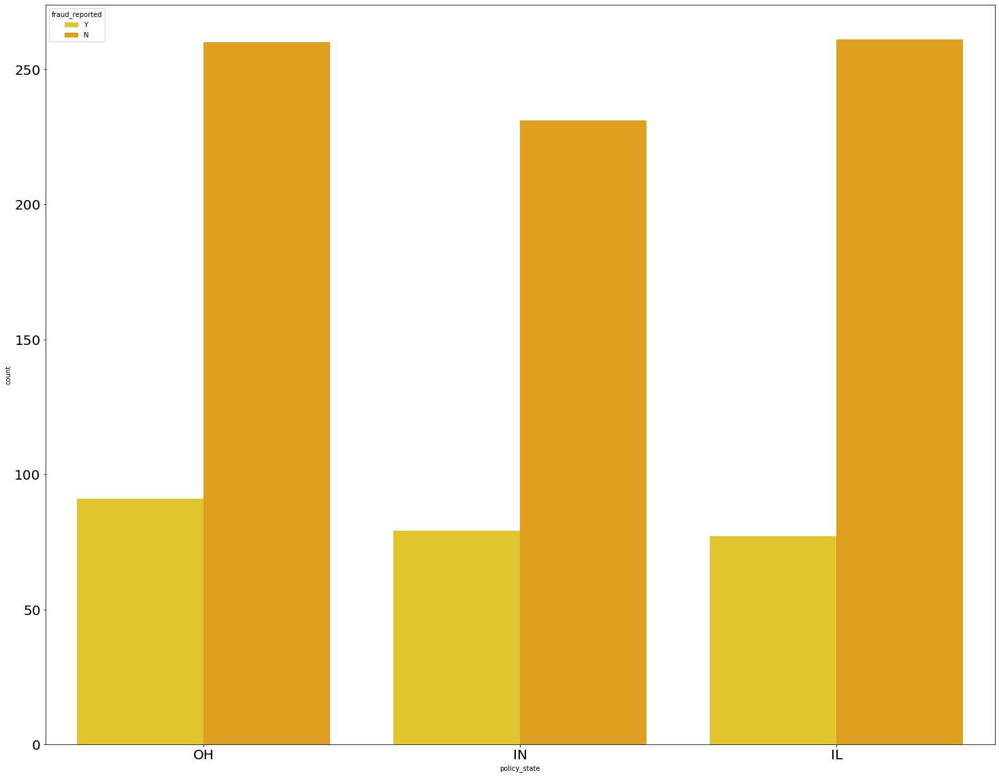

In [139]:
plt.figure(figsize=(25,20))
print(dfi['policy_state'].value_counts())
sns.countplot(x='policy_state',hue='fraud_reported',data=dfi,palette='Wistia')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

The Policy state is available in OH.

No Info    360
NO         338
YES        301
Name: property_damage, dtype: int64


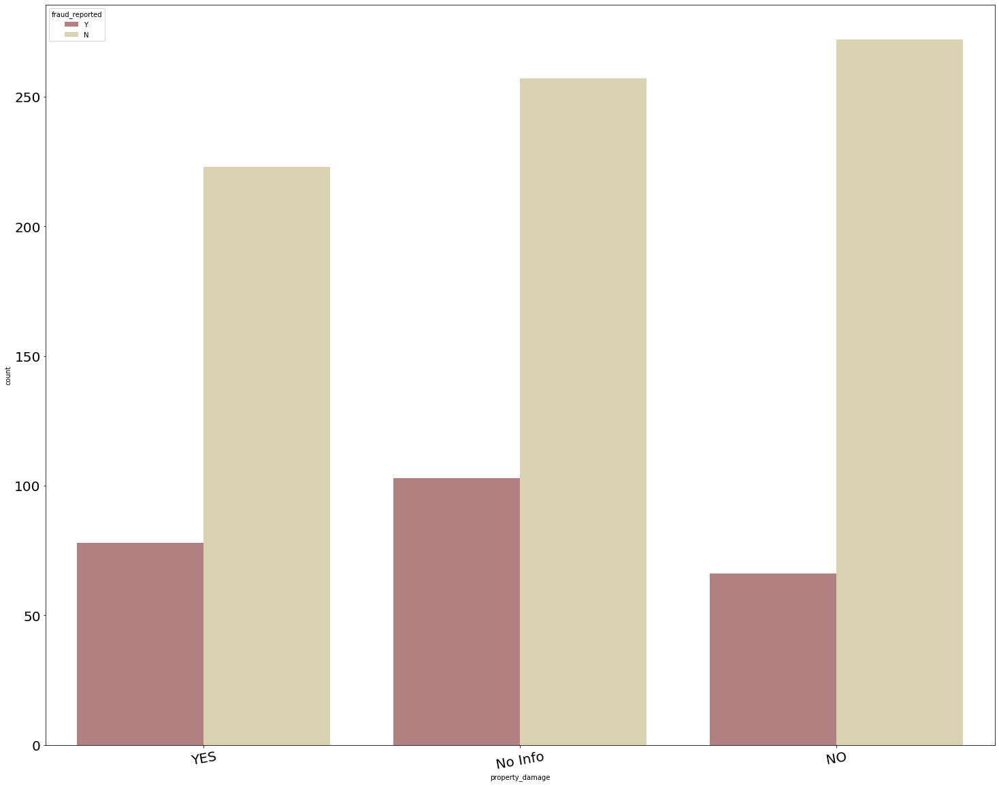

In [137]:
plt.figure(figsize=(25,20))
print(dfi['property_damage'].value_counts())
sns.countplot(x='property_damage',hue='fraud_reported',data=dfi,palette='pink')
plt.xticks(rotation=10,fontsize=20)
plt.yticks(fontsize=20)
plt.show()

There is slight difference between property damage and not damage. But there is a high count in that Property is not damage.

reading           64
paintball         57
exercise          57
bungie-jumping    56
golf              55
camping           55
movies            55
kayaking          53
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


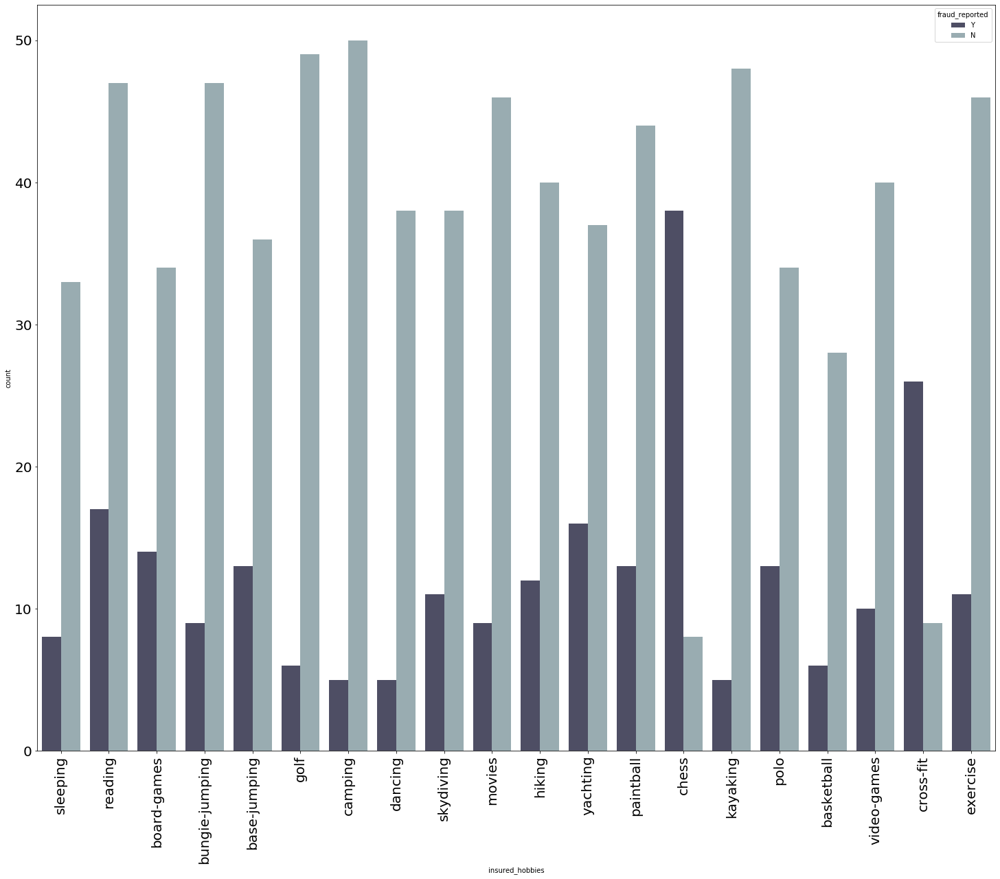

In [136]:
plt.figure(figsize=(25,20))
print(dfi['insured_hobbies'].value_counts())
sns.countplot(x='insured_hobbies',hue='fraud_reported',data=dfi,palette='bone')
plt.xticks(rotation=90,fontsize=20)
plt.yticks(fontsize=20)
plt.show()

Majority of insured hobbies is Reading

FEMALE    537
MALE      462
Name: insured_sex, dtype: int64


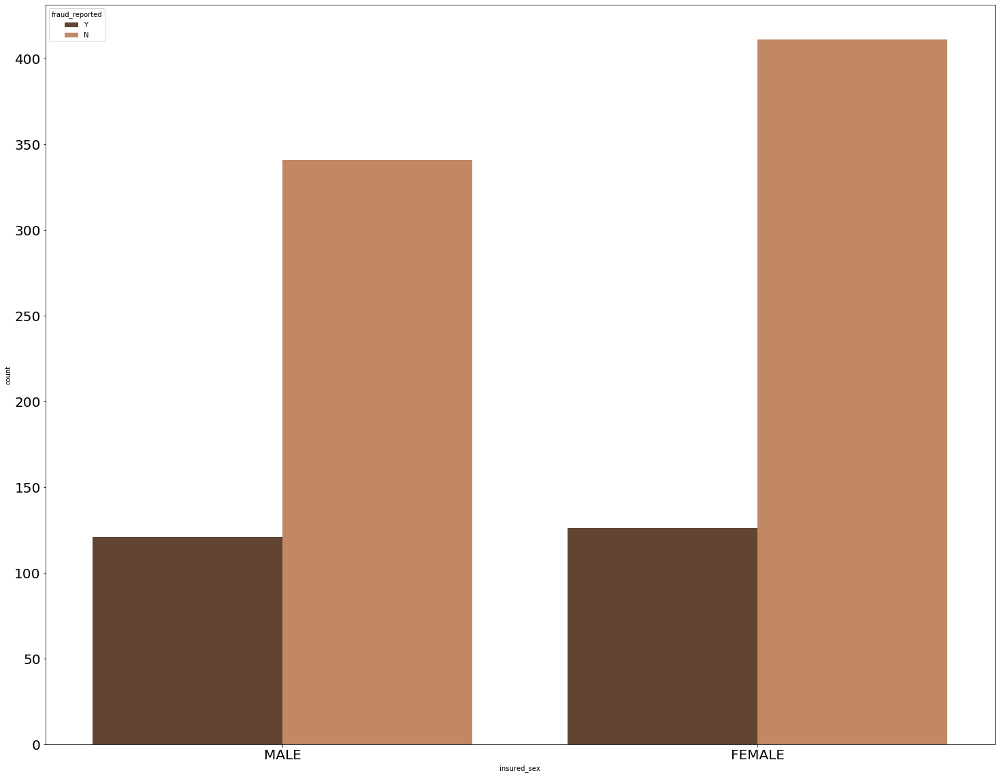

In [144]:
plt.figure(figsize=(25,20))
print(dfi['insured_sex'].value_counts())
sns.countplot(x='insured_sex',hue='fraud_reported',data=dfi,palette='copper')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

Female count is high as compared to male. This means more female has taken the insurance.

250/500     351
100/300     348
500/1000    300
Name: policy_csl, dtype: int64


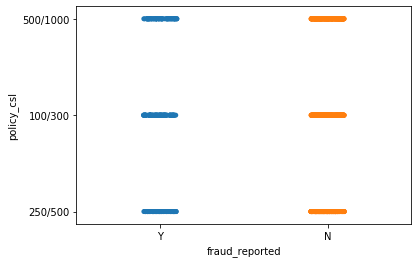

In [149]:
print(dfi['policy_csl'].value_counts())
sns.stripplot(y='policy_csl',x='fraud_reported',data=dfi)
plt.show()

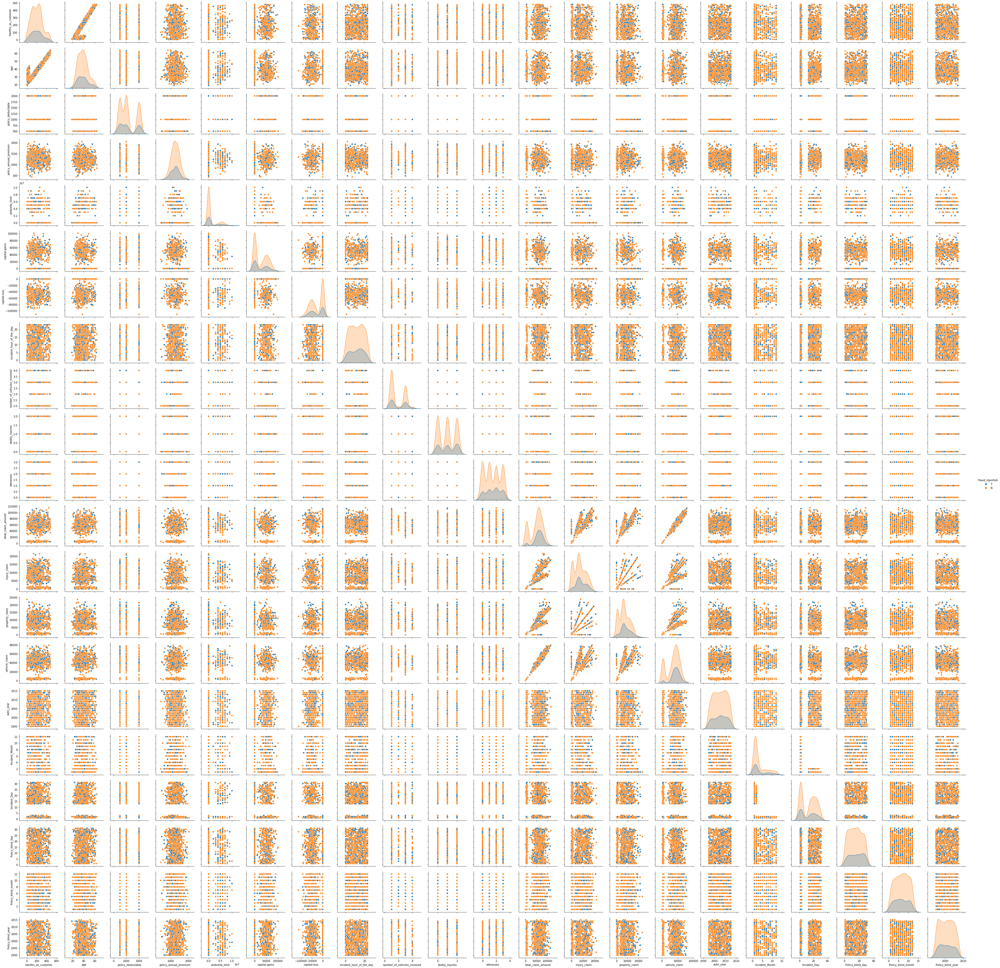

In [153]:
# checking the pairplot of each features

sns.pairplot(dfi,hue='fraud_reported')
plt.show()

In the diagonal the data's are normally distributed.

In [156]:
numerical_datas=[]
for i in dfi.dtypes.index:
    if dfi[i].dtypes!='object':
        numerical_datas.append(i)
numerical_datas

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year',
 'Incident_Month',
 'Incident_Day',
 'Policy_blind_day',
 'Policy_blind_month',
 'Policy_blind_year']

In [162]:
# Checking the data types for numerical data
dfi[numerical_datas].dtypes

months_as_customer               int64
age                              int64
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
capital-gains                    int64
capital-loss                     int64
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
bodily_injuries                  int64
witnesses                        int64
total_claim_amount               int64
injury_claim                     int64
property_claim                   int64
vehicle_claim                    int64
auto_year                        int64
Incident_Month                   int64
Incident_Day                     int64
Policy_blind_day                 int64
Policy_blind_month               int64
Policy_blind_year                int64
dtype: object

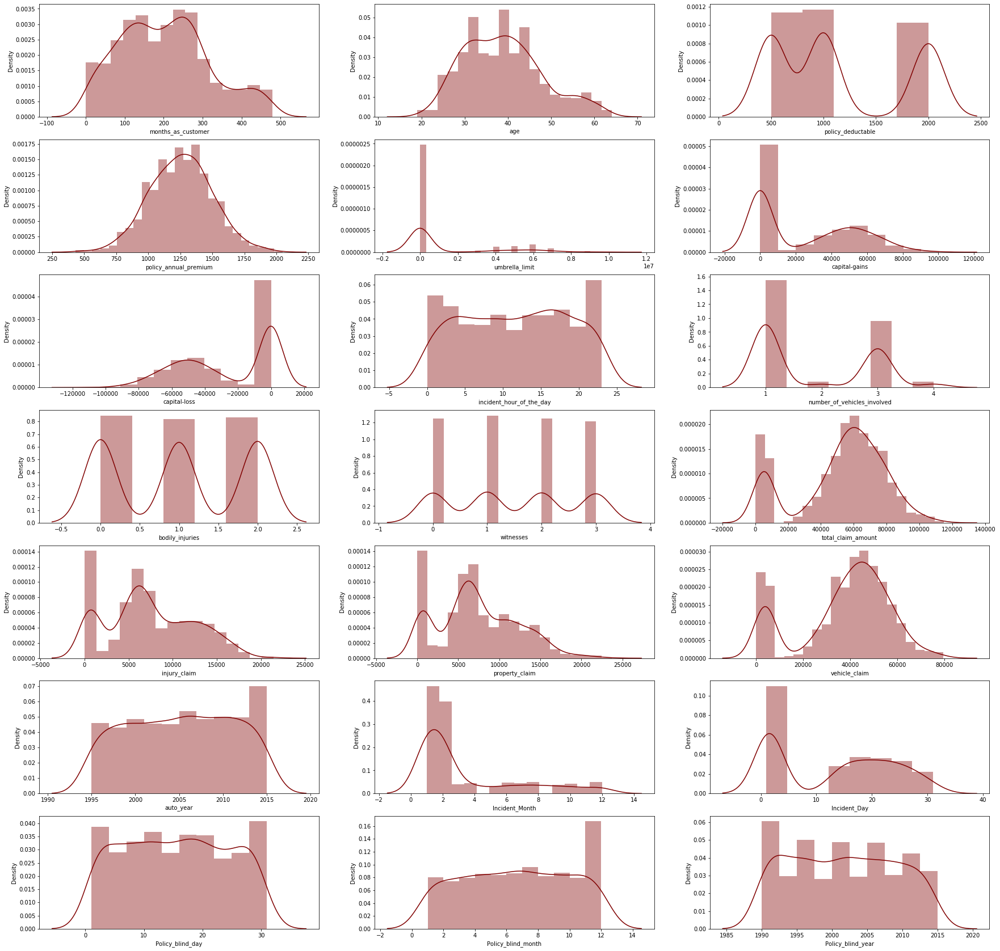

In [161]:
# Checking the distribution for numerical data

plt.figure(figsize=(30,30))
for i in enumerate(dfi.select_dtypes(include=['int64', 'float', 'int32'])):
    plt.subplot(7,3,i[0]+1)
    sns.distplot(dfi[i[1]],color='maroon')

# Outliers

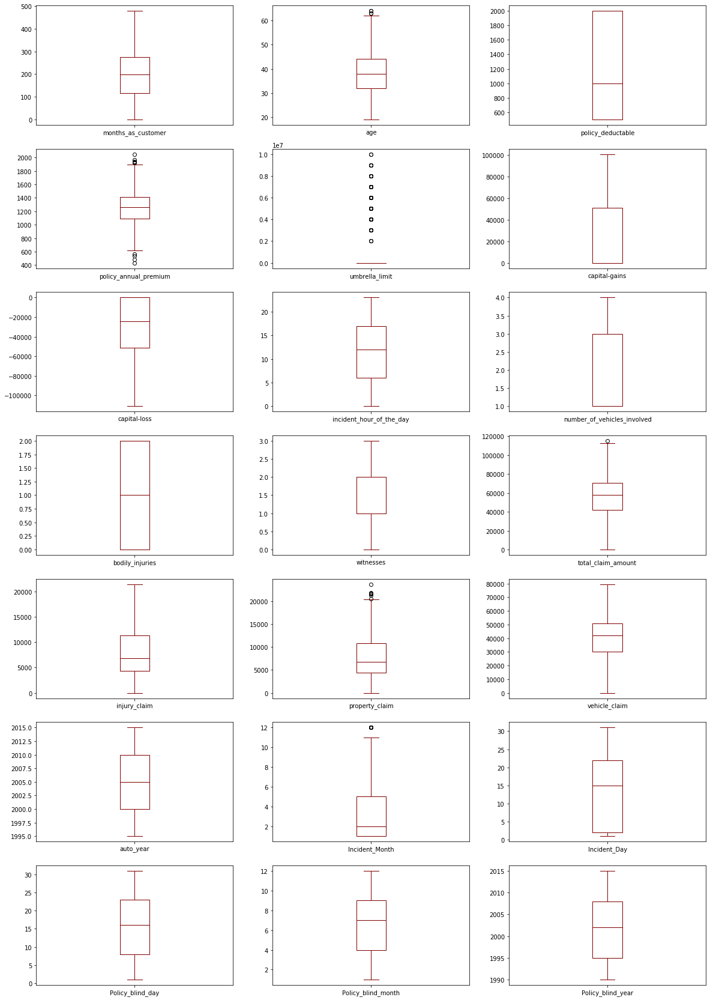

In [165]:
dfi.plot(kind='box',subplots=True,layout=(7,3),figsize=(20,30),color='maroon')
plt.show()

Outliers is present in age, policy_annual_premium, umbrella_limit, property_claim, incident_month.

# Outliers removal

In [168]:
outliers=dfi[['age','policy_annual_premium','umbrella_limit','property_claim','Incident_Month']]

In [169]:
z=np.abs(zscore(outliers))
z

array([[0.99073051, 0.61676787, 0.48035276, 1.16931914, 0.7356065 ],
       [0.33425929, 0.2420769 , 1.69692676, 1.37278728, 0.7356065 ],
       [1.08809503, 0.6422846 , 1.69692676, 0.73518379, 0.43030077],
       ...,
       [0.54103568, 0.52084463, 0.82601495, 0.02287899, 0.7356065 ],
       [2.5224967 , 0.41201967, 1.69692676, 0.45065064, 0.43030077],
       [2.30367295, 2.00748229, 0.48035276, 1.3437109 , 0.43030077]])

In [170]:
np.where(z>3)

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 313, 429, 457, 499, 502,
        656, 699, 762, 874, 921, 974], dtype=int64),
 array([2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 3, 2, 2, 2, 1, 2, 2, 2],
       dtype=int64))

In [171]:
dfi_new=dfi[(z<3).all(axis=1)]
dfi_new

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Incident_Month,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,...,52080,Saab,92x,2004,Y,1,25,17,10,2014
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,...,3510,Mercedes,E400,2007,Y,1,21,27,6,2006
2,134,29,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,...,23100,Dodge,RAM,2007,N,2,22,9,6,2000
3,256,41,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,...,50720,Chevrolet,Tahoe,2014,Y,10,1,25,5,1990
4,228,44,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,...,4550,Accura,RSX,2009,N,2,17,6,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,0,FEMALE,Masters,craft-repair,...,61040,Honda,Accord,2006,N,2,22,16,7,1991
996,285,41,IL,100/300,1000,1436.79,0,FEMALE,PhD,prof-specialty,...,72320,Volkswagen,Passat,2015,N,1,24,1,5,2014
997,130,34,OH,250/500,500,1383.49,3000000,FEMALE,Masters,armed-forces,...,52500,Suburu,Impreza,1996,N,1,23,17,2,2003
998,458,62,IL,500/1000,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,...,36540,Audi,A5,1998,N,2,26,18,11,2011


In [172]:
# Before removing the outliers
dfi.shape

(999, 39)

In [173]:
# After removing the outliers
dfi_new.shape

(980, 39)

In [174]:
dataloss=((999-980)/999)*100

In [175]:
dataloss

1.9019019019019021

1.9 % data has been removed in the Outliers.

# Skewness

In [176]:
dfi_new.skew()

months_as_customer             0.365125
age                            0.476754
policy_deductable              0.471943
policy_annual_premium          0.035865
umbrella_limit                 1.802554
capital-gains                  0.464317
capital-loss                  -0.388777
incident_hour_of_the_day      -0.037554
number_of_vehicles_involved    0.505303
bodily_injuries                0.000000
witnesses                      0.023314
total_claim_amount            -0.596371
injury_claim                   0.270023
property_claim                 0.358650
vehicle_claim                 -0.624140
auto_year                     -0.055278
Incident_Month                 1.388477
Incident_Day                   0.058615
Policy_blind_day               0.024771
Policy_blind_month            -0.026934
Policy_blind_year              0.061023
dtype: float64

Skewness present in Umbrella limit, total_claim_amount, vehicle_claim. Let's remove them using PowerTransformer

# Skewness Removal

In [177]:
from sklearn.preprocessing import PowerTransformer

In [178]:
skewed=['umbrella_limit','total_claim_amount','vehicle_claim']

In [179]:
scaled=PowerTransformer(method='yeo-johnson')
scaled

PowerTransformer()

In [181]:
dfi_new[skewed]=scaled.fit_transform(dfi_new[skewed].values)

In [182]:
dfi_new[skewed]

,umbrella_limit,total_claim_amount,vehicle_claim
0,-0.484001,0.721760,0.760297
1,2.066100,-1.778471,-1.787870
2,2.066100,-0.716438,-0.820887
3,2.067016,0.396020,0.683816
4,2.067016,-1.731320,-1.741354
...,...,...,...
995,-0.484001,1.347872,1.268480
996,-0.484001,2.216015,1.917771
997,2.063221,0.558319,0.783953
998,2.066100,-0.245519,-0.101669


In [183]:
dfi_new

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Incident_Month,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
0,328,48,OH,250/500,1000,1406.91,-0.484001,MALE,MD,craft-repair,...,0.760297,Saab,92x,2004,Y,1,25,17,10,2014
1,228,42,IN,250/500,2000,1197.22,2.066100,MALE,MD,machine-op-inspct,...,-1.787870,Mercedes,E400,2007,Y,1,21,27,6,2006
2,134,29,OH,100/300,2000,1413.14,2.066100,FEMALE,PhD,sales,...,-0.820887,Dodge,RAM,2007,N,2,22,9,6,2000
3,256,41,IL,250/500,2000,1415.74,2.067016,FEMALE,PhD,armed-forces,...,0.683816,Chevrolet,Tahoe,2014,Y,10,1,25,5,1990
4,228,44,IL,500/1000,1000,1583.91,2.067016,MALE,Associate,sales,...,-1.741354,Accura,RSX,2009,N,2,17,6,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,-0.484001,FEMALE,Masters,craft-repair,...,1.268480,Honda,Accord,2006,N,2,22,16,7,1991
996,285,41,IL,100/300,1000,1436.79,-0.484001,FEMALE,PhD,prof-specialty,...,1.917771,Volkswagen,Passat,2015,N,1,24,1,5,2014
997,130,34,OH,250/500,500,1383.49,2.063221,FEMALE,Masters,armed-forces,...,0.783953,Suburu,Impreza,1996,N,1,23,17,2,2003
998,458,62,IL,500/1000,2000,1356.92,2.066100,MALE,Associate,handlers-cleaners,...,-0.101669,Audi,A5,1998,N,2,26,18,11,2011


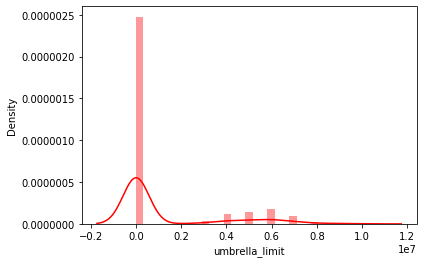

In [185]:
sns.distplot(dfi['umbrella_limit'],color='red') # Before removing the skewness

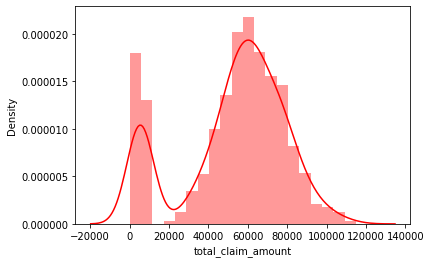

In [186]:
sns.distplot(dfi['total_claim_amount'],color='red')  # before removing the skewness
plt.show()

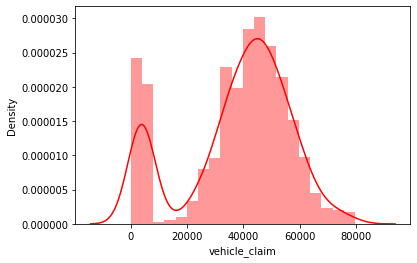

In [187]:
sns.distplot(dfi['vehicle_claim'],color='red')  #before removing the skewness
plt.show()

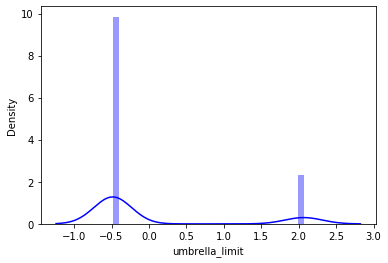

In [189]:
sns.distplot(dfi_new['umbrella_limit'],color='blue') # after removing the skewness
plt.show()

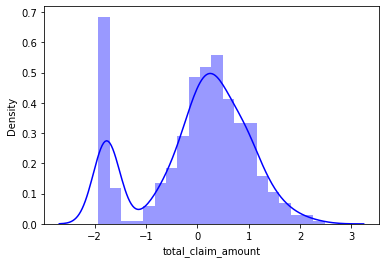

In [190]:
sns.distplot(dfi_new['total_claim_amount'],color='blue') # after removing the skewness
plt.show()

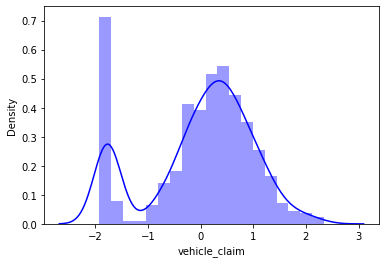

In [191]:
sns.distplot(dfi_new['vehicle_claim'],color='blue') # after removing the skewness
plt.show()

# Converting Categorical data to Numerical data using Label Encoder

In [192]:
from sklearn.preprocessing import LabelEncoder

In [193]:
LE=LabelEncoder()

In [196]:
categorical_col=dfi_new.select_dtypes(exclude=['float64','int64','int32'])
for i in categorical_col:
    dfi_new[i]=LE.fit_transform(dfi_new[i].astype(str))

In [197]:
dfi_new

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Incident_Month,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
0,328,48,2,1,1000,1406.91,-0.484001,1,4,2,...,0.760297,10,1,2004,1,1,25,17,10,2014
1,228,42,1,1,2000,1197.22,2.066100,1,4,6,...,-1.787870,8,12,2007,1,1,21,27,6,2006
2,134,29,2,0,2000,1413.14,2.066100,0,6,11,...,-0.820887,4,30,2007,0,2,22,9,6,2000
3,256,41,0,1,2000,1415.74,2.067016,0,6,1,...,0.683816,3,34,2014,1,10,1,25,5,1990
4,228,44,0,2,1000,1583.91,2.067016,1,0,11,...,-1.741354,0,31,2009,0,2,17,6,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,-0.484001,0,5,2,...,1.268480,6,6,2006,0,2,22,16,7,1991
996,285,41,0,0,1000,1436.79,-0.484001,0,6,9,...,1.917771,13,28,2015,0,1,24,1,5,2014
997,130,34,2,1,500,1383.49,2.063221,0,5,1,...,0.783953,11,19,1996,0,1,23,17,2,2003
998,458,62,0,2,2000,1356.92,2.066100,1,0,5,...,-0.101669,1,5,1998,0,2,26,18,11,2011


We have successfully converted all the categorical data to numerical data

In [198]:
# Checking the statistical summary of data
dfi_new.describe()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Incident_Month,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
count,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,9.800000e+02,980.000000,980.000000,980.000000,...,9.800000e+02,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000,980.000000
mean,204.513265,38.969388,1.019388,0.946939,1138.775510,1257.215459,-2.543317e-16,0.464286,2.962245,6.647959,...,3.072372e-16,6.567347,19.229592,2005.132653,0.244898,3.395918,13.072449,15.482653,6.556122,2001.578571
std,115.393774,9.183582,0.830122,0.804254,611.539134,241.571558,1.000511e+00,0.498978,1.951821,4.020319,...,1.000511e+00,4.031104,11.140451,6.015876,0.430246,3.266568,10.413212,8.827406,3.401903,7.391362
min,0.000000,19.000000,0.000000,0.000000,500.000000,538.170000,-4.840009e-01,0.000000,0.000000,0.000000,...,-1.928183e+00,0.000000,0.000000,1995.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1990.000000
25%,116.000000,32.000000,0.000000,0.000000,500.000000,1087.875000,-4.840009e-01,0.000000,1.000000,3.000000,...,-4.435156e-01,3.000000,10.000000,2000.000000,0.000000,1.000000,2.000000,8.000000,4.000000,1995.000000
50%,200.000000,38.000000,1.000000,1.000000,1000.000000,1257.200000,-4.840009e-01,0.000000,3.000000,7.000000,...,2.024409e-01,7.000000,20.000000,2005.000000,0.000000,2.000000,15.000000,16.000000,7.000000,2002.000000
75%,277.250000,44.250000,2.000000,2.000000,2000.000000,1415.825000,-4.840009e-01,1.000000,5.000000,10.000000,...,6.821310e-01,10.000000,29.000000,2010.000000,0.000000,5.000000,22.000000,23.000000,9.000000,2008.000000
max,479.000000,64.000000,2.000000,2.000000,2000.000000,1969.630000,2.067748e+00,1.000000,6.000000,13.000000,...,2.339442e+00,13.000000,38.000000,2015.000000,1.000000,12.000000,31.000000,31.000000,12.000000,2015.000000


In [199]:
# Checking the Correlation of data
dfi_new_corr=dfi_new.corr()
dfi_new_corr

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Incident_Month,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
months_as_customer,1.000000,0.923003,-0.008016,-2.105849e-02,0.031536,-0.004113,0.004553,0.059065,0.000331,0.006901,...,0.055165,0.050566,0.004988,0.002213,0.021784,0.019836,-0.011446,0.051420,0.004716,-0.041442
age,0.923003,1.000000,-0.020422,-1.294345e-02,0.032222,0.005177,-0.004587,0.073543,0.002158,0.014758,...,0.058577,0.034187,0.015284,0.006286,0.013533,0.018519,-0.006247,0.053380,0.014735,-0.031505
policy_state,-0.008016,-0.020422,1.000000,3.072424e-03,0.018840,0.014684,-0.005052,-0.019288,-0.025395,-0.025193,...,-0.008481,0.011361,-0.018596,0.000712,0.035312,0.028808,0.014254,0.000813,0.074668,-0.001997
policy_csl,-0.021058,-0.012943,0.003072,1.000000e+00,0.008757,0.033107,0.009295,-0.002182,0.006531,0.016331,...,-0.040710,-0.010554,0.043429,-0.032323,-0.033254,-0.011824,-0.000516,0.012244,-0.042218,-0.020433
policy_deductable,0.031536,0.032222,0.018840,8.756573e-03,1.000000,-0.007400,-0.001295,-0.007173,0.012524,-0.052815,...,0.007535,-0.030935,-0.004007,0.026504,0.014340,-0.011681,-0.018022,0.014165,-0.054810,-0.053712
policy_annual_premium,-0.004113,0.005177,0.014684,3.310664e-02,-0.007400,1.000000,-0.005967,0.040594,-0.020895,0.028191,...,0.008843,0.009084,-0.038893,-0.042554,-0.012707,0.009636,0.017751,-0.031722,-0.031308,0.003071
umbrella_limit,0.004553,-0.004587,-0.005052,9.294573e-03,-0.001295,-0.005967,1.000000,0.019014,-0.024003,0.007426,...,-0.038904,0.018377,0.012463,0.015752,0.051111,0.035340,-0.044339,-0.032384,-0.004160,0.058933
insured_sex,0.059065,0.073543,-0.019288,-2.181707e-03,-0.007173,0.040594,0.019014,1.000000,0.011724,-0.008056,...,-0.026073,0.022272,-0.017909,-0.030066,0.021751,0.038138,-0.017882,0.047631,-0.002428,-0.031088
insured_education_level,0.000331,0.002158,-0.025395,6.530955e-03,0.012524,-0.020895,-0.024003,0.011724,1.000000,-0.025647,...,0.075463,0.058679,0.043523,0.052100,0.012238,0.068513,-0.049519,0.017184,-0.013141,0.015535
insured_occupation,0.006901,0.014758,-0.025193,1.633062e-02,-0.052815,0.028191,0.007426,-0.008056,-0.025647,1.000000,...,0.003380,0.042968,0.014053,-0.000770,-0.000301,0.013502,-0.021227,0.004390,0.020678,-0.025863


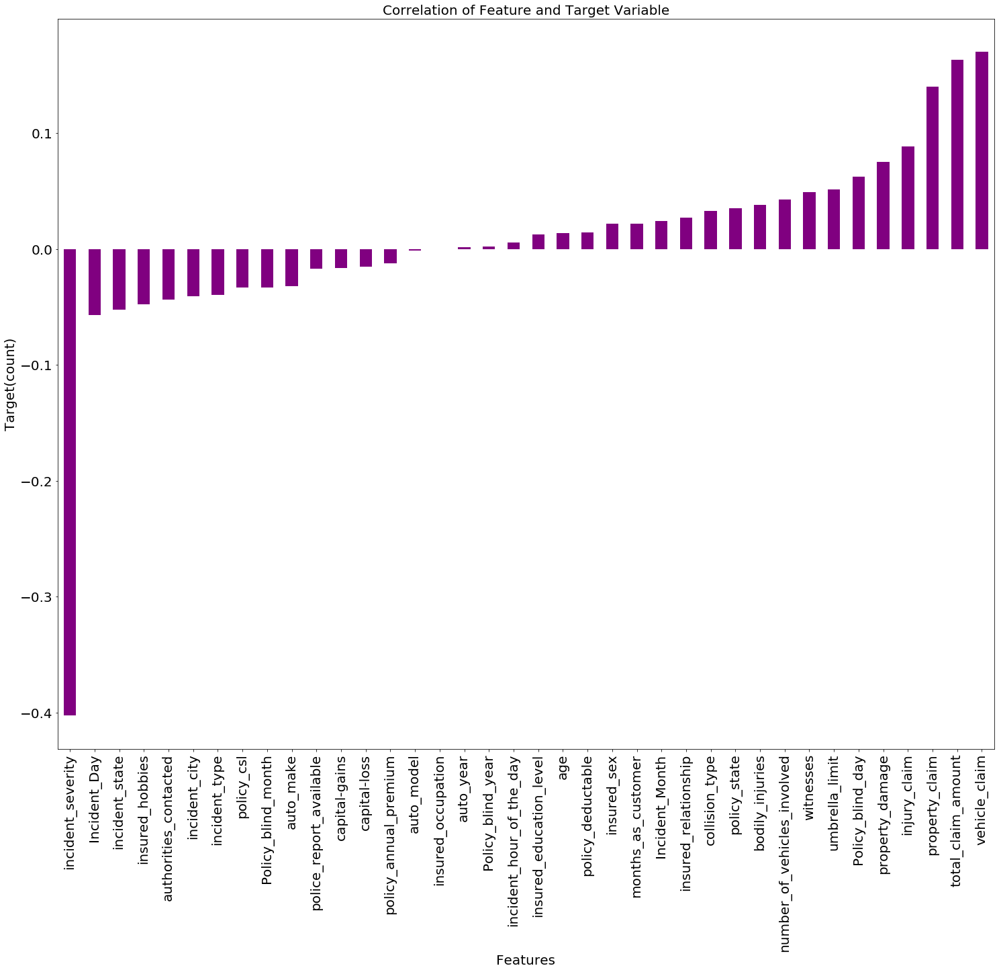

In [212]:
plt.figure(figsize=(25,20))
dfi_new.corr()['fraud_reported'].sort_values(ascending=True).drop(['fraud_reported']).plot(kind='bar',color='purple')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Features',fontsize=20)
plt.ylabel('Target(count)',fontsize=20)
plt.title('Correlation of Feature and Target Variable',fontsize=20)
plt.show()

# Splitting the data into Features(X) and Target(Y) Vriable

In [213]:
x=dfi_new.drop('fraud_reported',axis=1)
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,Incident_Month,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
0,328,48,2,1,1000,1406.91,-0.484001,1,4,2,...,13020,0.760297,10,1,2004,1,25,17,10,2014
1,228,42,1,1,2000,1197.22,2.066100,1,4,6,...,780,-1.787870,8,12,2007,1,21,27,6,2006
2,134,29,2,0,2000,1413.14,2.066100,0,6,11,...,3850,-0.820887,4,30,2007,2,22,9,6,2000
3,256,41,0,1,2000,1415.74,2.067016,0,6,1,...,6340,0.683816,3,34,2014,10,1,25,5,1990
4,228,44,0,2,1000,1583.91,2.067016,1,0,11,...,650,-1.741354,0,31,2009,2,17,6,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,-0.484001,0,5,2,...,8720,1.268480,6,6,2006,2,22,16,7,1991
996,285,41,0,0,1000,1436.79,-0.484001,0,6,9,...,18080,1.917771,13,28,2015,1,24,1,5,2014
997,130,34,2,1,500,1383.49,2.063221,0,5,1,...,7500,0.783953,11,19,1996,1,23,17,2,2003
998,458,62,0,2,2000,1356.92,2.066100,1,0,5,...,5220,-0.101669,1,5,1998,2,26,18,11,2011


In [233]:
y=dfi_new['fraud_reported']
y

0      1
1      1
2      0
3      1
4      0
      ..
995    0
996    0
997    0
998    0
999    0
Name: fraud_reported, Length: 980, dtype: int32

# Standard Scaler

In [224]:
sc=StandardScaler()
x_scaled=sc.fit_transform(x)
x_scaled

array([[ 1.07067983,  0.98384519,  1.18188984, ...,  0.17197824,
         1.0128554 ,  1.68139127],
       [ 0.20363947,  0.33017177, -0.02336723, ...,  1.30539234,
        -0.16355739,  0.59849407],
       [-0.61137847, -1.08612062,  1.18188984, ..., -0.73475303,
        -0.16355739, -0.21367882],
       ...,
       [-0.64606009, -0.54139278,  1.18188984, ...,  0.17197824,
        -1.33997018,  0.19240763],
       [ 2.19783231,  2.50908315, -1.2286243 , ...,  0.28531965,
         1.30695859,  1.27530482],
       [ 2.1804915 ,  2.29119201,  1.18188984, ..., -0.50807022,
         1.30695859, -0.75512742]])

In [225]:
x=pd.DataFrame(x_scaled,columns=x.columns)
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,Incident_Month,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
0,1.070680,0.983845,1.181890,0.066009,-0.227044,0.619986,-0.484001,1.074172,0.531957,-1.156707,...,1.178894,0.760297,0.851976,-1.637178,-0.188373,-0.733841,1.146010,0.171978,1.012855,1.681391
1,0.203639,0.330172,-0.023367,0.066009,1.409009,-0.248482,2.066100,1.074172,0.531957,-0.161253,...,-1.380126,-1.787870,0.355581,-0.649281,0.310562,-0.733841,0.761686,1.305392,-0.163557,0.598494
2,-0.611378,-1.086121,1.181890,-1.178014,1.409009,0.645789,2.066100,-0.930949,1.557164,1.083064,...,-0.738280,-0.820887,-0.637209,0.967278,0.310562,-0.427553,0.857767,-0.734753,-0.163557,-0.213679
3,0.446411,0.221226,-1.228624,0.066009,1.409009,0.656557,2.067016,-0.930949,1.557164,-1.405571,...,-0.217695,0.683816,-0.885407,1.326513,1.474744,2.022751,-1.159932,1.078710,-0.457661,-1.567300
4,0.203639,0.548063,-1.228624,1.310033,-0.227044,1.353062,2.067016,1.074172,-1.518458,1.083064,...,-1.407305,-1.741354,-1.630000,1.057086,0.643185,-0.427553,0.377363,-1.074777,-0.163557,1.681391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,-1.747201,-0.105611,1.181890,1.310033,-0.227044,0.221930,-0.484001,-0.930949,1.044561,-1.156707,...,0.279892,1.268480,-0.140814,-1.188134,0.144250,-0.427553,0.857767,0.058637,0.130546,-1.431938
976,0.697852,0.221226,-1.228624,-1.178014,-0.227044,0.743739,-0.484001,-0.930949,1.557164,0.585337,...,2.236789,1.917771,1.596569,0.787660,1.641055,-0.733841,1.049929,-1.641484,-0.457661,1.681391
977,-0.646060,-0.541393,1.181890,0.066009,-1.045071,0.522988,2.063221,-0.930949,1.044561,-1.405571,...,0.024826,0.783953,1.100174,-0.020619,-1.518867,-0.733841,0.953848,0.171978,-1.339970,0.192408
978,2.197832,2.509083,-1.228624,1.310033,1.409009,0.412944,2.066100,1.074172,-1.518458,-0.410117,...,-0.451854,-0.101669,-1.381802,-1.277943,-1.186244,-0.427553,1.242090,0.285320,1.306959,1.275305


# Oversampling Technique

In [231]:
dfi_new['fraud_reported'].value_counts()

0    740
1    240
Name: fraud_reported, dtype: int64

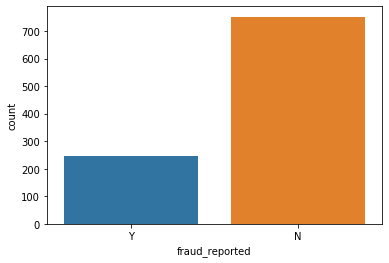

In [237]:
sns.countplot(dfi['fraud_reported'])

the data is imbalance, let's balance the data using SMOTE

In [221]:
from imblearn.over_sampling import SMOTE

In [229]:
x.shape

(980, 38)

In [234]:
y.shape

(980,)

In [235]:
SM=SMOTE()
x,y=SM.fit_resample(x,y)


0    740
1    740
Name: fraud_reported, dtype: int64


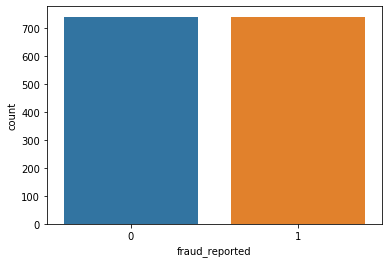

In [236]:
print(y.value_counts())
sns.countplot(y)
plt.show()

# Variance Inflation Factor

In [238]:
vif=pd.DataFrame()
vif['Features']=x.columns
vif['VIF']=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif

,Features,VIF
0,months_as_customer,7.729949
1,age,7.792583
2,policy_state,1.053967
3,policy_csl,1.054838
4,policy_deductable,1.075429
5,policy_annual_premium,1.041847
6,umbrella_limit,1.057198
7,insured_sex,1.055319
8,insured_education_level,1.057156
9,insured_occupation,1.054604


High variance inflation is present in total_claim_amount, injury_claim,property_claim,vehicle_claim. Let's drop total_claim_amount column

In [239]:
xi=dfi_new.drop('total_claim_amount',axis=1)
xi

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Incident_Month,Incident_Day,Policy_blind_day,Policy_blind_month,Policy_blind_year
0,328,48,2,1,1000,1406.91,-0.484001,1,4,2,...,0.760297,10,1,2004,1,1,25,17,10,2014
1,228,42,1,1,2000,1197.22,2.066100,1,4,6,...,-1.787870,8,12,2007,1,1,21,27,6,2006
2,134,29,2,0,2000,1413.14,2.066100,0,6,11,...,-0.820887,4,30,2007,0,2,22,9,6,2000
3,256,41,0,1,2000,1415.74,2.067016,0,6,1,...,0.683816,3,34,2014,1,10,1,25,5,1990
4,228,44,0,2,1000,1583.91,2.067016,1,0,11,...,-1.741354,0,31,2009,0,2,17,6,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,-0.484001,0,5,2,...,1.268480,6,6,2006,0,2,22,16,7,1991
996,285,41,0,0,1000,1436.79,-0.484001,0,6,9,...,1.917771,13,28,2015,0,1,24,1,5,2014
997,130,34,2,1,500,1383.49,2.063221,0,5,1,...,0.783953,11,19,1996,0,1,23,17,2,2003
998,458,62,0,2,2000,1356.92,2.066100,1,0,5,...,-0.101669,1,5,1998,0,2,26,18,11,2011


In [241]:
x_scaledi=sc.fit_transform(xi)
x_scaledi

array([[ 1.07067983,  0.98384519,  1.18188984, ...,  0.17197824,
         1.0128554 ,  1.68139127],
       [ 0.20363947,  0.33017177, -0.02336723, ...,  1.30539234,
        -0.16355739,  0.59849407],
       [-0.61137847, -1.08612062,  1.18188984, ..., -0.73475303,
        -0.16355739, -0.21367882],
       ...,
       [-0.64606009, -0.54139278,  1.18188984, ...,  0.17197824,
        -1.33997018,  0.19240763],
       [ 2.19783231,  2.50908315, -1.2286243 , ...,  0.28531965,
         1.30695859,  1.27530482],
       [ 2.1804915 ,  2.29119201,  1.18188984, ..., -0.50807022,
         1.30695859, -0.75512742]])

In [242]:
# Checking the VIF after drop the total_claim_amount
vif=pd.DataFrame()
vif['Features']=xi.columns
vif['VIF']=[variance_inflation_factor(x_scaledi,i) for i in range(x_scaledi.shape[1])]
vif

,Features,VIF
0,months_as_customer,6.917923
1,age,6.933229
2,policy_state,1.037788
3,policy_csl,1.031076
4,policy_deductable,1.048785
5,policy_annual_premium,1.033177
6,umbrella_limit,1.045526
7,insured_sex,1.029130
8,insured_education_level,1.051029
9,insured_occupation,1.018315


We have removed the high inflation from the data. There is no multicollinearity present in the data set. We are good to proceed to create our model

# Model Building

####  Checking the best random state

In [246]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [260]:
max_accu=0
max_RS=0
for i in range(1,100):
    train_x,test_x,train_y,test_y=train_test_split(x,y,test_size=.30,random_state=i)
    rf=RandomForestClassifier()
    rf.fit(train_x,train_y)
    rf_pred=rf.predict(test_x)
    accuracy=accuracy_score(test_y,rf_pred)
    if accuracy>max_accu:
        max_accu=accuracy
        max_RS=i
print("Best accuracy score:",max_accu,"On Random State:",max_RS)
    

Best accuracy score: 0.9031531531531531 On Random State: 19


# Principle Component Analysis

In [318]:
pca=PCA(n_components=10)
pca.fit(train_x,train_y)

PCA(n_components=10)

In [319]:
pca.fit_transform(x)

array([[ 0.62025227,  0.42650611, -0.74149745, ..., -0.32722354,
        -0.1686488 , -1.33280671],
       [-4.02825643,  0.29220356, -0.57423088, ...,  1.17913388,
        -0.48172596, -1.34056766],
       [-0.8974439 , -0.61099151,  1.86856606, ...,  0.69231508,
        -1.1089137 , -1.05078441],
       ...,
       [-0.32528767,  0.219102  , -0.07911599, ..., -0.58763297,
         0.28026294, -0.15958349],
       [ 0.99340293, -0.53085579,  1.25460689, ..., -0.12348967,
         1.23287604, -1.29450038],
       [ 0.95379294,  1.01916921, -1.92117476, ...,  1.59188914,
        -1.29899197,  0.74475606]])

In [320]:
pca.explained_variance_

array([3.42463987, 1.97560929, 1.7336484 , 1.61327788, 1.21102622,
       1.17448003, 1.15045619, 1.09430371, 1.07775513, 1.06516267])

In [321]:
pca.components_

array([[ 3.91794647e-02,  4.47441744e-02, -1.23615733e-02,
        -3.00916989e-02,  7.84182915e-03, -8.41993317e-03,
        -2.06881294e-02, -7.17179515e-04,  2.82626191e-02,
         4.63288842e-02,  2.28986427e-02,  3.66030413e-03,
         3.33910976e-02, -1.96391924e-02, -2.44025233e-01,
         1.31787832e-01, -2.72871296e-01, -1.50126944e-01,
        -2.25714255e-02,  1.60027702e-02,  1.60665972e-01,
         2.43652360e-01,  5.05519527e-02,  4.33681453e-02,
         1.91034026e-02,  1.95607542e-02,  4.59689792e-01,
         3.88467231e-01,  3.95969867e-01,  4.40527664e-01,
        -2.59585245e-02,  2.92869655e-02,  1.68457988e-03,
         5.94346278e-02, -6.67261660e-02,  4.56508262e-03,
         4.65506516e-02, -5.67454779e-03],
       [ 6.37917272e-01,  6.49474243e-01,  5.01072426e-02,
         4.14072574e-02,  1.00509640e-01,  2.78381466e-02,
        -1.77944716e-03,  1.18395594e-01, -1.25843744e-02,
         2.87793002e-02, -1.34546669e-01,  1.26307882e-01,
         8.92

# Logistic Regression

In [261]:
lg=LogisticRegression()
lg.fit(train_x,train_y)

LogisticRegression()

In [262]:
lg_pred=lg.predict(test_x)
print("Predicted Value:\n",lg_pred)

Predicted Value:
 [1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 0 1 1 0 1 0 0 1 0 1 1 0 0 0 0 1 1 1 1 0 1 1
 0 1 1 1 1 1 0 1 0 1 0 1 0 1 0 1 1 0 0 0 1 1 1 0 1 0 1 1 1 1 0 1 1 0 1 0 1
 1 1 0 0 0 1 1 1 0 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 1 0 0 0 0 1 0 1 1 0
 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 1
 0 0 1 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 1 0 0 1 0 0 1 1 1 0 1 1 1 1 0 1
 1 1 0 0 1 0 1 1 1 1 0 1 0 1 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 0 0 0 0 1 1 1 0
 0 0 0 1 1 1 0 0 0 0 1 0 1 1 1 0 1 1 0 0 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 0 1
 0 0 1 1 1 0 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1 0 0 0 1 1 1 0 0 0 1 1 1 1 1 0 0
 1 1 1 1 1 1 1 0 1 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 1 1 0 0 1 0 0 0 0 1 1 1 1
 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 1 0 0 1 1 1 0 1 0 0 0 0 0 0 0 1 0 1 1
 0 0 0 1 1 1 1 0 0 0 0 1 1 0 1 0 1 1 0 0 0 1 1 1 0 1 1 0 0 1 0 1 1 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 1 1 0 1 1 0 1 0 1 0 1 0 0 1 1 0 1 0 1 0 0 1 0 0 0 1]


In [303]:
print("Accuracy Score is:",accuracy_score(test_y,lg_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(test_y,lg_pred),'\n')
print("Classification Report:\n",classification_report(test_y,lg_pred))

Accuracy Score is: 0.6869369369369369 

Confusion Matrix:
 [[154  75]
 [ 64 151]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.67      0.69       229
           1       0.67      0.70      0.68       215

    accuracy                           0.69       444
   macro avg       0.69      0.69      0.69       444
weighted avg       0.69      0.69      0.69       444



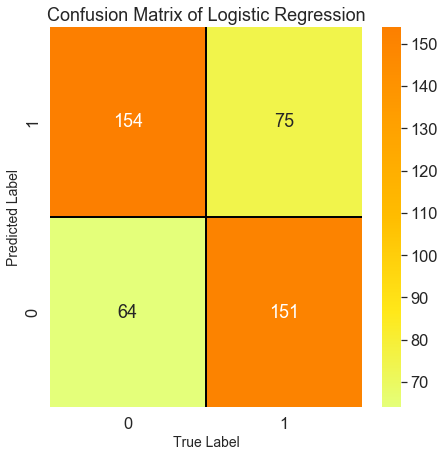

In [272]:
cm=confusion_matrix(test_y,lg_pred)

x_axis='0','1'
y_axis='1','0'

figure,axes=plt.subplots(figsize=(7,7))
sns.set(font_scale=1.5)

sns.heatmap(cm, annot=True, xticklabels=x_axis, yticklabels=y_axis,fmt='0.0f',linecolor='black',cmap='Wistia',linewidth=0.2)

plt.title('Confusion Matrix of Logistic Regression')
plt.xlabel('True Label',fontsize=14)
plt.ylabel('Predicted Label',fontsize=14)
plt.show()

# Decision Tree Classifier

In [273]:
dtc=DecisionTreeClassifier()
dtc.fit(train_x,train_y)

DecisionTreeClassifier()

In [274]:
dtc_pred=dtc.predict(test_x)
print("Predicted Value:\n",dtc_pred)

Predicted Value:
 [1 1 0 0 0 0 1 0 0 0 1 1 0 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0 0 0 1 0 1 0 0 1 0
 0 0 1 0 0 1 0 0 0 1 0 0 1 1 0 1 0 0 0 0 1 1 1 0 1 0 0 1 1 0 0 1 1 0 1 1 0
 0 1 1 0 0 1 1 1 1 1 1 0 1 0 1 0 1 1 1 0 0 0 1 1 0 0 1 1 0 0 0 1 1 0 1 1 0
 0 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 1 0 1 1
 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 1 1 1 1 0 1
 0 0 0 0 1 1 1 0 1 1 1 1 0 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 0 0 1 0 0 0 1 0 0
 1 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 0 0 1 0 1 1 0 0 1 1 0 1 0 1 1 0 1 0 1 1 0
 0 0 1 1 1 1 0 1 1 0 0 1 1 0 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 0 0 0 0
 1 1 1 0 0 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 1 1 0 0 1 1 0 1 0 0 0 1 1
 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 0
 0 0 0 1 1 0 1 0 0 1 0 1 1 0 0 1 1 1 0 0 0 0 1 1 0 0 1 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 1 1 1 1 0 0 1]


In [302]:
print("Accuracy Score is:",accuracy_score(test_y,dtc_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(test_y,dtc_pred),'\n')
print("Classification Report:\n",classification_report(test_y,dtc_pred))

Accuracy Score is: 0.8243243243243243 

Confusion Matrix:
 [[196  33]
 [ 45 170]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.86      0.83       229
           1       0.84      0.79      0.81       215

    accuracy                           0.82       444
   macro avg       0.83      0.82      0.82       444
weighted avg       0.82      0.82      0.82       444



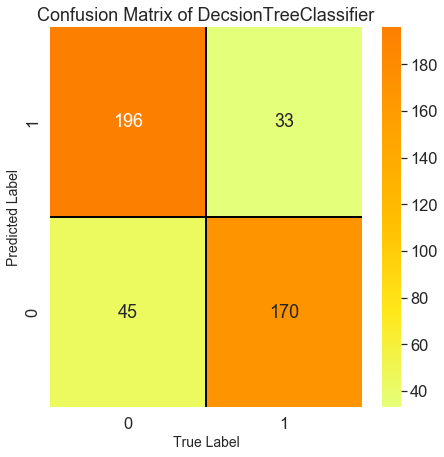

In [276]:
cm=confusion_matrix(test_y,dtc_pred)

x_axis='0','1'
y_axis='1','0'

figure,axes=plt.subplots(figsize=(7,7))
sns.set(font_scale=1.5)

sns.heatmap(cm, annot=True, xticklabels=x_axis, yticklabels=y_axis,fmt='0.0f',linecolor='black',cmap='Wistia',linewidth=0.2)

plt.title('Confusion Matrix of DecsionTreeClassifier')
plt.xlabel('True Label',fontsize=14)
plt.ylabel('Predicted Label',fontsize=14)
plt.show()

# Random Forest Classifier

In [277]:
rfc=RandomForestClassifier()
rfc.fit(train_x,train_y)

RandomForestClassifier()

In [278]:
rfc_pred=rfc.predict(test_x)
print("Predicted Value:\n",rfc_pred)

Predicted Value:
 [0 1 0 0 0 0 1 0 1 0 1 1 0 1 1 0 1 1 0 1 0 0 1 0 1 1 0 1 0 0 1 0 0 0 0 1 1
 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 1 0 0 1 1 0 0 1 1 0 1 0 1
 1 1 0 0 0 1 1 1 0 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 0 0 1 1 0 0 0 1 1 0 0 1 0
 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 0 0 1 0 1 0 1 1 1 0 0 0 1 0 0 1 1 1 1 0 1
 1 0 0 0 1 0 1 1 1 1 1 1 0 1 1 0 1 1 1 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0
 1 0 0 1 1 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 1 0 1 1 0 0 0 1 0 1
 0 0 1 1 1 1 1 1 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 0 1 0 0
 1 1 1 1 0 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 0 0 1 1 1 0 0 1 1 0 1 0 0 0 1 1
 1 1 0 0 1 1 0 0 0 1 0 0 0 0 0 1 1 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 0 1 1 0 0
 1 0 0 1 1 1 1 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 1 1 0 0 1 0 0 0 1 0 1 0 0 1 1 0 1 0 1 1 1 1 0 0 0 1]


In [301]:
print("Accuracy Score is:",accuracy_score(test_y,rfc_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(test_y,rfc_pred),'\n')
print("Classification Report:\n",classification_report(test_y,rfc_pred))

Accuracy Score is: 0.8626126126126126 

Confusion Matrix:
 [[203  26]
 [ 35 180]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.89      0.87       229
           1       0.87      0.84      0.86       215

    accuracy                           0.86       444
   macro avg       0.86      0.86      0.86       444
weighted avg       0.86      0.86      0.86       444



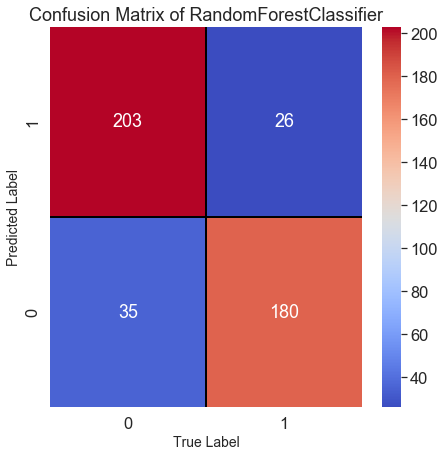

In [280]:
cm=confusion_matrix(test_y,rfc_pred)

x_axis='0','1'
y_axis='1','0'

figure,axes=plt.subplots(figsize=(7,7))
sns.set(font_scale=1.5)

sns.heatmap(cm, annot=True, xticklabels=x_axis, yticklabels=y_axis,fmt='0.0f',linecolor='black',cmap='coolwarm',linewidth=0.2)

plt.title('Confusion Matrix of RandomForestClassifier')
plt.xlabel('True Label',fontsize=14)
plt.ylabel('Predicted Label',fontsize=14)
plt.show()

# KNeighborsClassifier

In [281]:
knn=KNeighborsClassifier()
knn.fit(train_x,train_y)

KNeighborsClassifier()

In [282]:
knn_pred=knn.predict(test_x)
print('Predicted Value:\n',knn_pred)

Predicted Value:
 [1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 0 1 0
 0 1 1 0 1 1 0 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 0 1 1 1
 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1
 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 1
 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0
 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1
 0 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 1 0 1 1 1 1 1 0 1 1 0 1 1 0 0 1 1
 1 1 1 0 1 1 1 0 0 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 0 1 0 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1
 1 0 1 1 0 1 1 1 1 1 0 0 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1]


In [300]:
print("Accuracy Score is:",accuracy_score(test_y,knn_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(test_y,knn_pred),'\n')
print("Classification Report:\n",classification_report(test_y,knn_pred))

Accuracy Score is: 0.6261261261261262 

Confusion Matrix:
 [[ 71 158]
 [  8 207]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.31      0.46       229
           1       0.57      0.96      0.71       215

    accuracy                           0.63       444
   macro avg       0.73      0.64      0.59       444
weighted avg       0.74      0.63      0.58       444



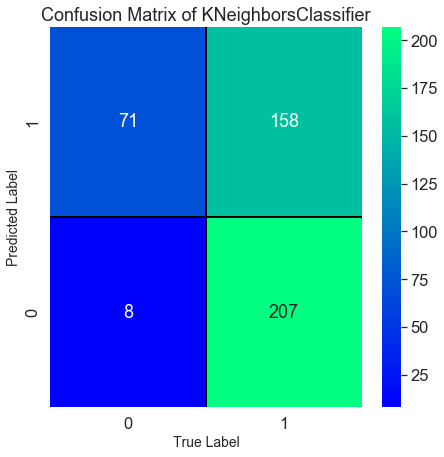

In [284]:
cm=confusion_matrix(test_y,knn_pred)

x_axis='0','1'
y_axis='1','0'

figure,axes=plt.subplots(figsize=(7,7))
sns.set(font_scale=1.5)

sns.heatmap(cm, annot=True, xticklabels=x_axis, yticklabels=y_axis,fmt='0.0f',linecolor='black',cmap='winter',linewidth=0.2)

plt.title('Confusion Matrix of KNeighborsClassifier')
plt.xlabel('True Label',fontsize=14)
plt.ylabel('Predicted Label',fontsize=14)
plt.show()

# Gradient Boosting Classifier

In [285]:
gbc=GradientBoostingClassifier()
gbc.fit(train_x,train_y)

GradientBoostingClassifier()

In [286]:
gbc_pred=gbc.predict(test_x)
print('Predicted Value:\n',gbc_pred)

Predicted Value:
 [0 1 0 0 0 0 1 0 0 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 0 1 0 0 1 0 0 0 0 1 1
 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 1 1 0 1 1 1
 1 1 0 0 0 0 1 1 0 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 0 0 1 1 0 0 0 1 1 0 0 1 0
 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 1 0 1 1
 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 0 0 1 0 1 0 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1
 0 0 0 0 1 1 1 1 0 1 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0
 1 0 0 1 1 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 1 0 0 0 1 0 0
 0 0 1 0 1 0 1 1 1 0 0 0 1 0 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 0 1 0 0
 1 1 1 1 0 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 0 1 0 1 1 0 0 1 1 0 1 0 0 0 1 1
 1 1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 0
 1 0 0 1 1 1 1 0 0 1 0 1 1 0 0 0 1 1 0 0 0 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 0
 0 0 0 0 0 1 1 0 0 1 0 1 1 0 0 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 1 1 1 0 0 0 1]


In [299]:
print("Accuracy Score is:",accuracy_score(test_y,gbc_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(test_y,gbc_pred),'\n')
print("Classification Report:\n",classification_report(test_y,gbc_pred))

Accuracy Score is: 0.8783783783783784 

Confusion Matrix:
 [[202  27]
 [ 27 188]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.88      0.88       229
           1       0.87      0.87      0.87       215

    accuracy                           0.88       444
   macro avg       0.88      0.88      0.88       444
weighted avg       0.88      0.88      0.88       444



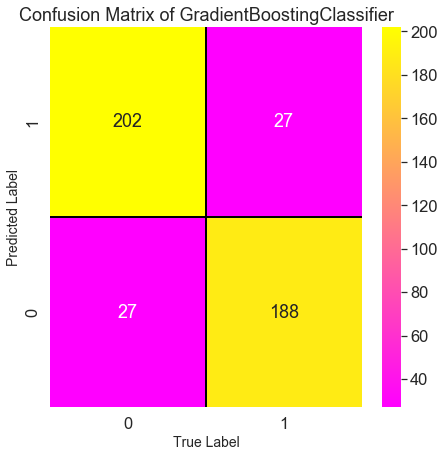

In [288]:
cm=confusion_matrix(test_y,gbc_pred)

x_axis='0','1'
y_axis='1','0'

figure,axes=plt.subplots(figsize=(7,7))
sns.set(font_scale=1.5)

sns.heatmap(cm, annot=True, xticklabels=x_axis, yticklabels=y_axis,fmt='0.0f',linecolor='black',cmap='spring',linewidth=0.2)

plt.title('Confusion Matrix of GradientBoostingClassifier')
plt.xlabel('True Label',fontsize=14)
plt.ylabel('Predicted Label',fontsize=14)
plt.show()

# Ada Boost Classifier

In [289]:
ada=AdaBoostClassifier()
ada.fit(train_x,train_y)

AdaBoostClassifier()

In [290]:
ada_pred=ada.predict(test_x)
print('Predicted Value:\n',ada_pred)

Predicted Value:
 [0 1 0 0 0 0 1 0 0 1 1 1 0 1 1 0 1 1 0 1 0 1 1 1 1 0 0 1 0 0 0 0 0 0 0 1 1
 0 1 1 0 0 1 0 0 1 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 1 1 0 1 1 0
 1 1 0 0 0 1 1 1 0 1 0 0 1 1 0 1 1 1 1 0 1 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 0
 0 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 1 1
 0 0 0 0 1 0 0 0 0 1 0 1 1 0 1 0 0 0 0 1 1 0 1 1 1 0 0 0 1 1 1 1 1 1 1 0 1
 1 0 0 0 1 0 1 1 0 1 1 1 0 1 1 1 0 0 1 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0
 1 0 0 1 1 1 0 0 1 1 1 0 0 0 1 1 0 0 1 0 1 1 0 0 1 1 0 1 0 1 1 0 0 0 1 0 1
 0 0 1 0 1 0 1 1 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 1 1 1 0 0 1 1 1 1 0 1 0 0
 1 1 1 1 0 1 0 1 1 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 1 1 0 0 1 1 0 1 0 0 0 1 1
 1 1 0 0 1 1 0 0 0 1 0 0 0 0 0 1 1 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 0 1 1 0 0
 1 0 0 1 1 1 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 1 1 1 0 0 0 0 0
 0 1 0 0 0 1 1 0 0 0 0 1 1 0 1 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 1 1 1 0 0 1 1]


In [298]:
print("Accuracy Score is:",accuracy_score(test_y,ada_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(test_y,ada_pred),'\n')
print("Classification Report:\n",classification_report(test_y,ada_pred))

Accuracy Score is: 0.8400900900900901 

Confusion Matrix:
 [[197  32]
 [ 39 176]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.86      0.85       229
           1       0.85      0.82      0.83       215

    accuracy                           0.84       444
   macro avg       0.84      0.84      0.84       444
weighted avg       0.84      0.84      0.84       444



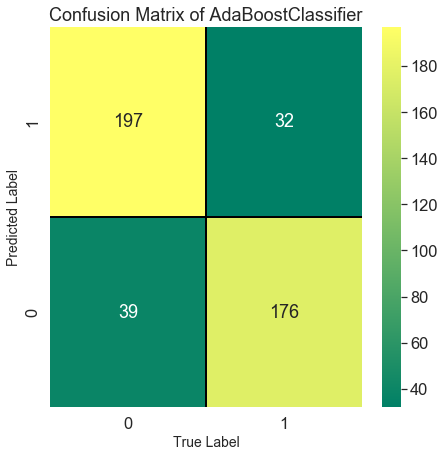

In [292]:
cm=confusion_matrix(test_y,ada_pred)

x_axis='0','1'
y_axis='1','0'

figure,axes=plt.subplots(figsize=(7,7))
sns.set(font_scale=1.5)

sns.heatmap(cm, annot=True, xticklabels=x_axis, yticklabels=y_axis,fmt='0.0f',linecolor='black',cmap='summer',linewidth=0.2)

plt.title('Confusion Matrix of AdaBoostClassifier')
plt.xlabel('True Label',fontsize=14)
plt.ylabel('Predicted Label',fontsize=14)
plt.show()

In [293]:
bc=BaggingClassifier()
bc.fit(train_x,train_y)

BaggingClassifier()

In [294]:
bc_pred=bc.predict(test_x)
print('Predicted Value:\n',bc_pred)

Predicted Value:
 [0 1 0 0 0 0 1 0 1 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 0 0 0 1 0 0 1 1
 0 1 1 1 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 1 1 0 1 1 1
 1 1 0 0 1 0 1 0 1 1 0 0 1 1 0 0 1 1 1 0 0 1 1 1 0 0 1 0 0 0 0 1 1 0 0 1 0
 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 1 0 1 1
 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 0 1 1 1 0 0 1 1 1 0 0 0 1 1 0 1
 0 0 0 0 1 1 1 1 0 1 1 1 0 1 1 0 1 1 1 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0
 1 0 0 1 1 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 1 0 0 0 1 0 1
 0 0 1 0 1 0 0 1 1 0 0 0 1 0 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 0 1 0 0
 1 1 1 1 0 0 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 0 1 0 1 1 0 0 1 1 0 1 0 0 0 1 1
 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 0
 1 0 0 1 1 1 1 0 0 1 0 0 1 0 0 0 1 1 1 0 0 0 1 1 0 0 1 1 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 1 0 1 0 0 1 1 0 1 0 1 1 1 1 0 0 0 1]


In [295]:
print("Accuracy Score is:",accuracy_score(test_y,bc_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(test_y,bc_pred),'\n')
print("Classification Report:\n",classification_report(test_y,bc_pred))

Accuracy Score is: 0.8671171171171171 

Confusion Matrix:
 [[203  26]
 [ 33 182]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.89      0.87       229
           1       0.88      0.85      0.86       215

    accuracy                           0.87       444
   macro avg       0.87      0.87      0.87       444
weighted avg       0.87      0.87      0.87       444



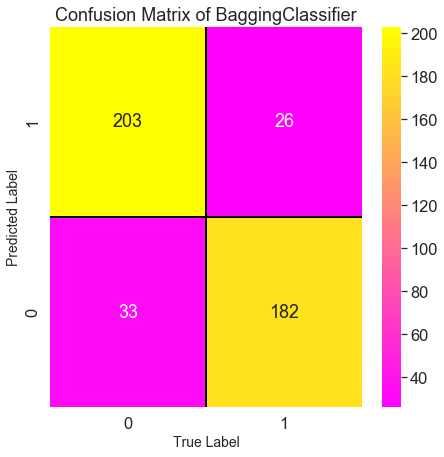

In [297]:
cm=confusion_matrix(test_y,bc_pred)

x_axis='0','1'
y_axis='1','0'

figure,axes=plt.subplots(figsize=(7,7))
sns.set(font_scale=1.5)

sns.heatmap(cm, annot=True, xticklabels=x_axis, yticklabels=y_axis,fmt='0.0f',linecolor='black',cmap='spring',linewidth=0.2)

plt.title('Confusion Matrix of BaggingClassifier')
plt.xlabel('True Label',fontsize=14)
plt.ylabel('Predicted Label',fontsize=14)
plt.show()

# Support Vector Classifier

In [304]:
svc=SVC()
svc.fit(train_x,train_y)

SVC()

In [305]:
svc_pred=svc.predict(test_x)
print('Predicted Value:\n',svc_pred)

Predicted Value:
 [1 1 0 0 0 0 1 0 1 1 1 1 0 1 1 0 1 1 1 1 0 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0 1 1 1 0 1 1 0 1 0 1
 1 1 0 0 0 1 1 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1 0 1 0 0 1 1 0 0 0 1 1 0 1 1 0
 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1
 0 0 1 1 1 0 0 0 0 1 0 1 1 0 1 0 0 0 1 0 1 0 0 1 1 0 0 0 1 1 1 1 1 1 1 0 1
 1 0 0 0 1 0 1 1 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 0 1 1 0 0 0 0 0 0 1 1 0
 0 0 0 1 1 1 0 0 1 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 1 1 0 1 0 1 0 0 0 0 1 0 1
 0 0 1 0 1 0 1 1 1 0 0 0 1 0 1 1 0 1 1 0 1 0 1 0 1 1 1 0 0 1 1 1 1 0 1 0 0
 1 1 1 0 0 1 1 0 1 1 0 0 0 0 1 0 0 1 0 1 0 0 1 0 1 1 0 0 1 0 0 1 0 0 0 1 1
 1 1 0 0 1 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 1 1 1 0 1 0 0 0 1 0 0 1 1 1 0 0
 1 0 0 1 1 1 1 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 0 1 1 0 0 1 0 1 0 0 0 0 0
 0 0 0 1 0 1 1 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 1 0 1 0 0 0 1]


In [306]:
print("Accuracy Score is:",accuracy_score(test_y,svc_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(test_y,svc_pred),'\n')
print("Classification Report:\n",classification_report(test_y,svc_pred))

Accuracy Score is: 0.8243243243243243 

Confusion Matrix:
 [[190  39]
 [ 39 176]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.83      0.83       229
           1       0.82      0.82      0.82       215

    accuracy                           0.82       444
   macro avg       0.82      0.82      0.82       444
weighted avg       0.82      0.82      0.82       444



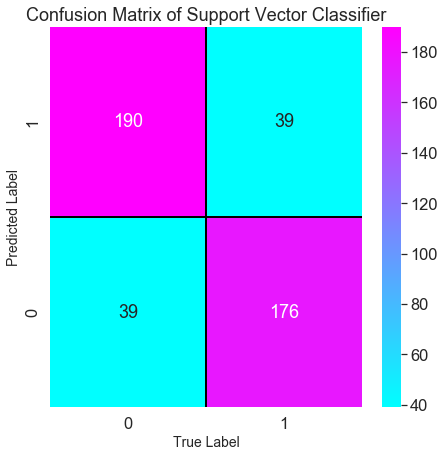

In [308]:
cm=confusion_matrix(test_y,svc_pred)

x_axis='0','1'
y_axis='1','0'

figure,axes=plt.subplots(figsize=(7,7))
sns.set(font_scale=1.5)

sns.heatmap(cm, annot=True, xticklabels=x_axis, yticklabels=y_axis,fmt='0.0f',linecolor='black',cmap='cool',linewidth=0.2)

plt.title('Confusion Matrix of Support Vector Classifier')
plt.xlabel('True Label',fontsize=14)
plt.ylabel('Predicted Label',fontsize=14)
plt.show()

In [309]:
for clf in (lg,dtc,rfc,ada,gbc,svc,bc,knn):
    clf.fit(train_x,train_y)
    clf_pred=clf.predict(test_x)
    print(clf.__class__.__name__,accuracy_score(test_y,clf_pred))

LogisticRegression 0.6869369369369369
DecisionTreeClassifier 0.8063063063063063
RandomForestClassifier 0.8716216216216216
AdaBoostClassifier 0.8400900900900901
GradientBoostingClassifier 0.8783783783783784
SVC 0.8243243243243243
BaggingClassifier 0.8716216216216216
KNeighborsClassifier 0.6261261261261262


Upon Analysis of various model, Gradient Boosting Classifier model gives a good accuracy score 87.8%.

# Cross Validation Score

In [310]:
print('Cross Validation score for Logistic Regression:',cross_val_score(lg,x,y,cv=5).mean())

Cross Validation score for Logistic Regression: 0.7283783783783784


In [311]:
print('Cross Validation score for Decision Tree Classifier:',cross_val_score(dtc,x,y,cv=5).mean())

Cross Validation score for Decision Tree Classifier: 0.8391891891891892


In [312]:
print('Cross Validation score for Random Forest Classifier:',cross_val_score(rfc,x,y,cv=5).mean())

Cross Validation score for Random Forest Classifier: 0.8722972972972973


In [313]:
print('Cross Validation score for KNeighbors Classifier:',cross_val_score(knn,x,y,cv=5).mean())

Cross Validation score for KNeighbors Classifier: 0.6601351351351351


In [314]:
print('Cross Validation score for Gradient Boosting Classifier:',cross_val_score(gbc,x,y,cv=5).mean())

Cross Validation score for Gradient Boosting Classifier: 0.8655405405405405


In [315]:
print('Cross Validation score for Ada Boost Classifier:',cross_val_score(ada,x,y,cv=5).mean())

Cross Validation score for Ada Boost Classifier: 0.8256756756756756


In [316]:
print('Cross Validation score for Bagging Classifier:',cross_val_score(bc,x,y,cv=5).mean())

Cross Validation score for Bagging Classifier: 0.8601351351351351


In [317]:
print('Cross Validation score for Support Vector Classifier:',cross_val_score(svc,x,y,cv=5).mean())

Cross Validation score for Support Vector Classifier: 0.8574324324324325


After analsis of various models and cross validation score, I choose Gradient Boosting Classifier as my final model. As it gives a good accuracy score.

# Hyper Parameter tuning

In [325]:
params={'criterion':['mse','mae'],
       'n_estimators':[100,150],
       'learning_rate':[0.001,0.01,1.0],
       'random_state':[19],
       'max_depth':[5,10]}

In [326]:
grid_search=GridSearchCV(estimator=gbc,param_grid=params,cv=3,verbose=3)


In [327]:
grid_search.fit(train_x,train_y)

Fitting 3 folds for each of 24 candidates, totalling 72 fits
[CV 1/3] END criterion=mse, learning_rate=0.001, max_depth=5, n_estimators=100, random_state=19;, score=0.850 total time=   1.0s
[CV 2/3] END criterion=mse, learning_rate=0.001, max_depth=5, n_estimators=100, random_state=19;, score=0.878 total time=   1.0s
[CV 3/3] END criterion=mse, learning_rate=0.001, max_depth=5, n_estimators=100, random_state=19;, score=0.861 total time=   0.9s
[CV 1/3] END criterion=mse, learning_rate=0.001, max_depth=5, n_estimators=150, random_state=19;, score=0.853 total time=   1.5s
[CV 2/3] END criterion=mse, learning_rate=0.001, max_depth=5, n_estimators=150, random_state=19;, score=0.881 total time=   1.5s
[CV 3/3] END criterion=mse, learning_rate=0.001, max_depth=5, n_estimators=150, random_state=19;, score=0.864 total time=   1.4s
[CV 1/3] END criterion=mse, learning_rate=0.001, max_depth=10, n_estimators=100, random_state=19;, score=0.827 total time=   1.6s
[CV 2/3] END criterion=mse, learnin

GridSearchCV(cv=3, estimator=GradientBoostingClassifier(),
             param_grid={'criterion': ['mse', 'mae'],
                         'learning_rate': [0.001, 0.01, 1.0],
                         'max_depth': [5, 10], 'n_estimators': [100, 150],
                         'random_state': [19]},
             verbose=3)

In [329]:
grid_search.best_params_

{'criterion': 'mse',
 'learning_rate': 1.0,
 'max_depth': 5,
 'n_estimators': 100,
 'random_state': 19}

In [331]:
grid_search.best_estimator_

GradientBoostingClassifier(criterion='mse', learning_rate=1.0, max_depth=5,
                           random_state=19)

In [332]:
grid_search.best_score_

0.882270810644774

# Final Model

In [333]:
final_model=GradientBoostingClassifier(criterion='mse',learning_rate=1.0,max_depth=5,n_estimators=100,random_state=19)

In [334]:
final_model.fit(train_x,train_y)

GradientBoostingClassifier(criterion='mse', learning_rate=1.0, max_depth=5,
                           random_state=19)

In [335]:
final_model_pred=final_model.predict(test_x)
print("Predicted value:\n",final_model_pred)

Predicted value:
 [0 1 0 0 0 0 1 0 0 0 0 1 0 1 1 0 1 1 0 1 0 1 1 1 0 1 1 1 0 0 1 0 0 0 0 1 1
 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 1 1 0 1 1 1
 1 1 0 0 0 1 1 1 0 1 0 0 1 1 1 1 0 1 1 0 0 1 1 1 0 0 1 1 0 0 0 1 1 0 0 1 0
 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 1 0 1 1
 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 0 0 1 0 1 0 0 1 1 0 0 1 1 0 1 1 1 1 1 0 1
 0 0 0 0 1 1 1 1 0 1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0
 1 0 0 1 1 1 0 0 1 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 1 0 0 0 1 0 1
 0 0 1 0 1 1 1 1 1 0 0 0 1 0 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 0 1 0 0
 1 1 1 0 0 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 0 1 0 1 1 0 0 1 1 0 1 0 0 0 1 1
 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 0
 1 0 0 1 1 1 1 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 0
 0 0 0 0 0 1 1 0 0 1 0 1 1 0 1 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 1 1 1 0 0 0 1]


In [336]:
print("Accuracy Score is:",accuracy_score(test_y,final_model_pred),'\n')
print("Confusion Matrix:\n",confusion_matrix(test_y,final_model_pred),'\n')
print("Classification Report:\n",classification_report(test_y,final_model_pred))

Accuracy Score is: 0.8761261261261262 

Confusion Matrix:
 [[202  27]
 [ 28 187]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.88      0.88       229
           1       0.87      0.87      0.87       215

    accuracy                           0.88       444
   macro avg       0.88      0.88      0.88       444
weighted avg       0.88      0.88      0.88       444



After tuning the parameter I got 87.6%, it didn't increase the accuracy but remain the same accuracy.

# ROC Curve

In [337]:
from sklearn.metrics import roc_auc_score,roc_curve
from sklearn.metrics import plot_roc_curve

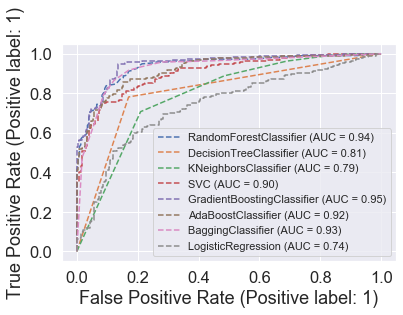

In [346]:

dist=plot_roc_curve(rfc,test_x,test_y,linestyle='--')
plot_roc_curve(dtc,test_x,test_y,ax=dist.ax_,linestyle='--')
plot_roc_curve(knn,test_x,test_y,ax=dist.ax_,linestyle='--')
plot_roc_curve(svc,test_x,test_y,ax=dist.ax_,linestyle='--')
plot_roc_curve(gbc,test_x,test_y,ax=dist.ax_,linestyle='--')
plot_roc_curve(ada,test_x,test_y,ax=dist.ax_,linestyle='--')
plot_roc_curve(bc,test_x,test_y,ax=dist.ax_,linestyle='--')
plot_roc_curve(lg,test_x,test_y,ax=dist.ax_,linestyle='--')
plt.legend(prop={'size':11},loc='lower right')
plt.show()

In the above roc_curve, we see that Gradient Boosting Classifier gives AUC Score 95%

# ROC AUC Score

In [347]:
print('ROC AUC Score',roc_auc_score(test_y,final_model_pred))

ROC AUC Score 0.8759317558647304


The ROC AUC Score is 87.5%. Which is a good score.

In [352]:
fpr,tpr,thresholds=roc_curve(test_y,final_model_pred)

In [353]:
fpr

array([0.        , 0.11790393, 1.        ])

In [354]:
tpr

array([0.        , 0.86976744, 1.        ])

In [355]:
thresholds

array([2, 1, 0])

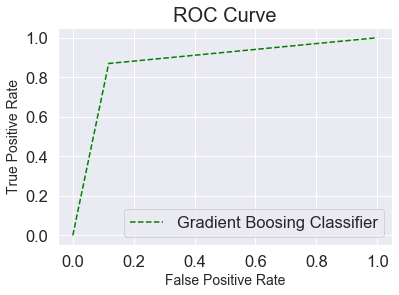

In [358]:
plt.plot(fpr,tpr,linestyle='--',color='green',label='Gradient Boosing Classifier')
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)
plt.title('ROC Curve',fontsize=20)
plt.legend(loc='lower right')
plt.show()

# Saving the Model

In [359]:
import pickle

In [360]:
filename='fraud_detection_predictions.pickle'

In [361]:
pickle.dump(gbc,open(filename,'wb'))

In [362]:
loaded_model=pickle.load(open(filename,'rb'))

In [363]:
loaded_model.fit(train_x,train_y)

GradientBoostingClassifier()

In [365]:
loaded_model_pred=loaded_model.predict(test_x)
print("Predicted Value:\n",loaded_model_pred)

Predicted Value:
 [0 1 0 0 0 0 1 0 0 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 0 1 0 0 1 0 0 0 0 1 1
 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 1 1 0 1 1 1
 1 1 0 0 0 0 1 1 0 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 0 0 1 1 0 0 0 1 1 0 0 1 0
 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 1 0 1 1
 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 0 0 1 0 1 0 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1
 0 0 0 0 1 1 1 1 0 1 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0
 1 0 0 1 1 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 1 0 0 0 1 0 0
 0 0 1 0 1 0 1 1 1 0 0 0 1 0 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 0 1 0 0
 1 1 1 1 0 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 0 1 0 1 1 0 0 1 1 0 1 0 0 0 1 1
 1 1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 0
 1 0 0 1 1 1 1 0 0 1 0 1 1 0 0 0 1 1 0 0 0 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 0
 0 0 0 0 0 1 1 0 0 1 0 1 1 0 0 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 1 1 1 0 0 0 1]


In [366]:
loaded_model.score(train_x,train_y) # Score for training data

0.9768339768339769

In [367]:
loaded_model.score(test_x,test_y) # Score for Testing data

0.8783783783783784

In [368]:
df=pd.DataFrame([loaded_model.predict(test_x)[:],test_y[:]],index=['Predicted','Actual'])
df

,0,1,2,3,4,5,6,7,8,9,...,434,435,436,437,438,439,440,441,442,443
Predicted,0,1,0,0,0,0,1,0,0,0,...,1,0,1,1,1,1,0,0,0,1
Actual,0,0,0,0,0,0,1,0,1,0,...,1,0,1,1,1,1,0,0,0,1


In [369]:
df.T

,Predicted,Actual
0,0,0
1,1,0
2,0,0
3,0,0
4,0,0
...,...,...
439,1,1
440,0,0
441,0,0
442,0,0


Here is the predicted and Actual value for Fraud reported prediction. The value almost looks similar to actual value. Based on this predictions we can predict the fraud detections.

In [370]:
# Saving the model in csv format

df.to_csv('fraud_insurance_claim_predictions.csv')